<a href="https://colab.research.google.com/github/Zahrameg/Traffic-Sign-Recognition-YOLOv10/blob/main/Traffic_Sign_Recognition_YOLOv10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Importation des Bibliothèques et Chemins

In [1]:
import os
import shutil
import random
import cv2
import matplotlib.pyplot as plt
from collections import Counter

%pip install albumentations --quiet  
import albumentations as A
from google.colab import drive

In [9]:
from google.colab import drive

# Check if the drive is already mounted
if not os.path.exists('/content/drive'):
  drive.mount('/content/drive')
else:
  print("Google Drive is already mounted.")

BASE_DIR = "/content/drive/MyDrive/DATASIGNALISATION"

Google Drive is already mounted.


- albumentations : pour les transformations d’images (flip, rotation, bruit, etc.).
- matplotlib : pour la visualisation (histogrammes).
- cv2 : (OpenCV) pour la lecture/écriture d’images.



In [2]:
import os
import shutil

# Chemins avant nettoyage
TRAIN_IMAGE = os.path.join(BASE_DIR, "train", "images")
TRAIN_LABEL = os.path.join(BASE_DIR, "train", "labels")

# Chemins après nettoyage
IMG_NETTOY = os.path.join(BASE_DIR, "cleaned_images")
LBL_NETTOY = os.path.join(BASE_DIR, "cleaned_labels")
os.makedirs(IMG_NETTOY, exist_ok=True)
os.makedirs(LBL_NETTOY, exist_ok=True)

# Chemins pour l’augmentation
IMG_AUGM = os.path.join(BASE_DIR, "aug_images")
LBL_AUGM = os.path.join(BASE_DIR, "aug_labels")
os.makedirs(IMG_AUGM, exist_ok=True)
os.makedirs(LBL_AUGM, exist_ok=True)
# Chemins splits (train/val/test) finaux
REPERTOIRE_FINAL = os.path.join(BASE_DIR, "final_dataset")
os.makedirs(REPERTOIRE_FINAL, exist_ok=True)
for split in ["train", "val", "test"]:
    os.makedirs(os.path.join(REPERTOIRE_FINAL, split, "images"), exist_ok=True)
    os.makedirs(os.path.join(REPERTOIRE_FINAL, split, "labels"), exist_ok=True)

NameError: name 'BASE_DIR' is not defined

# Analyse des occurrences des classes d

    

===== ANALYSE DES CLASSES =====
Occurrences des classes :
Classe 130: 7 occurrences
Classe 109: 117 occurrences
Classe 76: 9 occurrences
Classe 160: 5 occurrences
Classe 23: 40 occurrences
Classe 13: 55 occurrences
Classe 132: 17 occurrences
Classe 2: 50 occurrences
Classe 120: 7 occurrences
Classe 215: 13 occurrences
Classe 184: 10 occurrences
Classe 5: 50 occurrences
Classe 59: 5 occurrences
Classe 245: 9 occurrences
Classe 259: 23 occurrences
Classe 251: 9 occurrences
Classe 231: 4 occurrences
Classe 12: 108 occurrences
Classe 133: 6 occurrences
Classe 159: 25 occurrences
Classe 141: 36 occurrences
Classe 73: 86 occurrences
Classe 172: 8 occurrences
Classe 230: 10 occurrences
Classe 26: 19 occurrences
Classe 142: 32 occurrences
Classe 68: 32 occurrences
Classe 79: 8 occurrences
Classe 111: 52 occurrences
Classe 64: 31 occurrences
Classe 38: 9 occurrences
Classe 92: 27 occurrences
Classe 15: 22 occurrences
Classe 188: 24 occurrences
Classe 35: 7 occurrences
Classe 250: 8 occurrences


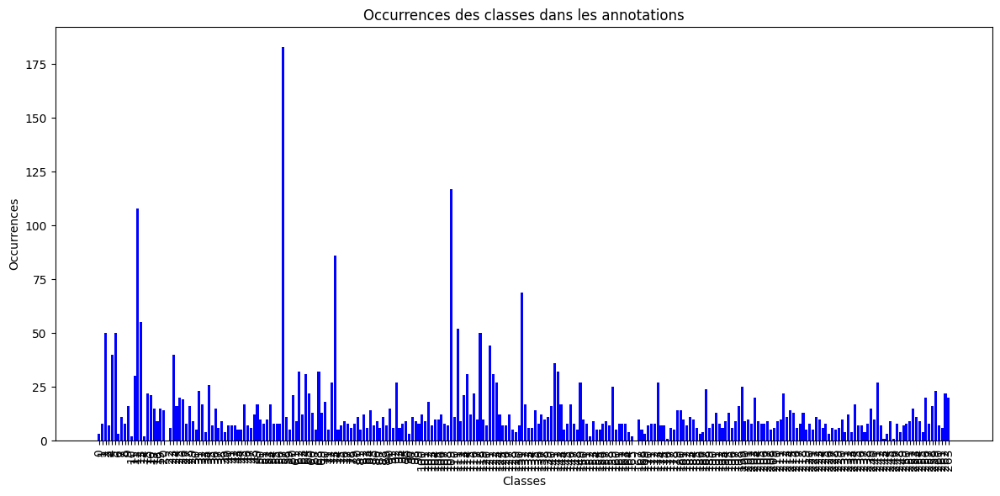

In [ ]:
def analyser_et_tracer_occurrences_classes(chemin_labels):
    occurrences_classes = Counter()

    # Parcourir les fichiers d'annotations
    for fichier in os.listdir(chemin_labels):
        if not fichier.endswith(".txt"):
            continue

        chemin_fichier = os.path.join(chemin_labels, fichier)

        # Lire les annotations dans chaque fichier
        with open(chemin_fichier, 'r') as lbl:
            lignes = lbl.readlines()
            for ligne in lignes:
                parties = ligne.strip().split()
                if len(parties) == 5:
                    try:
                        classe_id = int(parties[0])
                        occurrences_classes[classe_id] += 1
                    except ValueError:
                        continue


    print("Occurrences des classes :")
    for classe_id, nombre in occurrences_classes.items():
        print(f"Classe {classe_id}: {nombre} occurrences")

    classes = list(occurrences_classes.keys())
    occurrences = list(occurrences_classes.values())

    plt.figure(figsize=(12, 6))
    plt.bar(classes, occurrences, color='blue')
    plt.xlabel("Classes")
    plt.ylabel("Occurrences")
    plt.title("Occurrences des classes dans les annotations")
    plt.xticks(classes, rotation=90)
    plt.tight_layout()
    plt.show()


    TRAIN_LABEL = os.path.join(BASE_DIR, "train", "labels")

# Analyse et affichage des occurrences des classes
print("===== ANALYSE DES CLASSES =====")
analyser_et_tracer_occurrences_classes(TRAIN_LABEL)


Classe 20 (Image: 7d9cc687-f17-1_jpg.rf.8066dd43e6634a3cf9f62eed19148486.jpg)


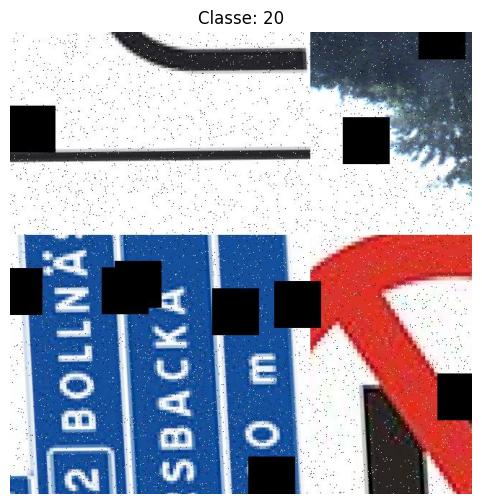

Classe 20 (Image: 234517f3-f3-1_jpg.rf.314a84d0bbdf2d2046bef4b0ed607a8b.jpg)


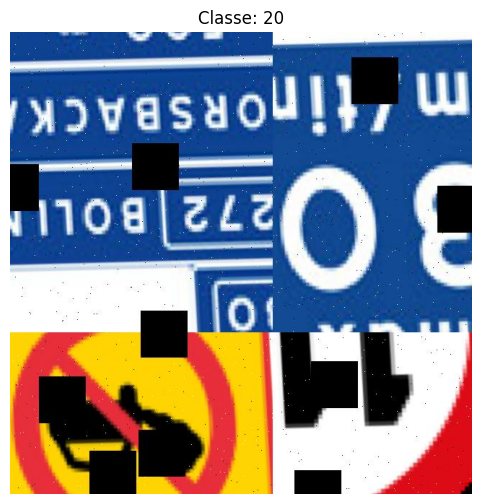

Classe 20 (Image: 6243122d-1277381967Image000014_jpg.rf.6cdd9060482e7b7564e3a433a23d9b8d.jpg)


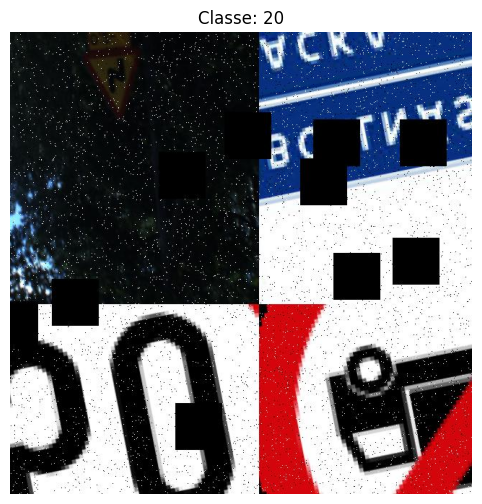

Classe 20 (Image: 7640f049-c12-1_jpg.rf.e8c909d67b59aa2fa9235bd5304cc7d3.jpg)


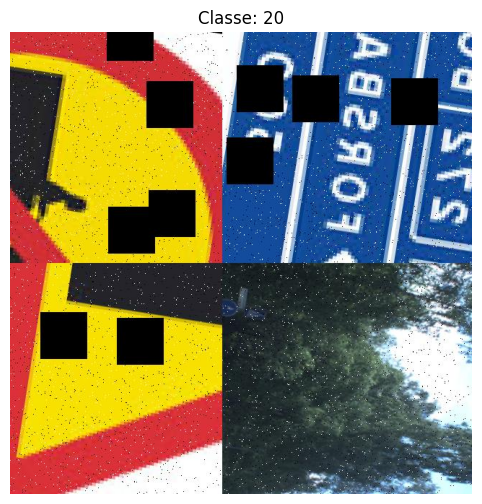

Classe 20 (Image: 85a2952e-d12-1_jpg.rf.fbf5570534b22d17078c9ae49f3509ae.jpg)


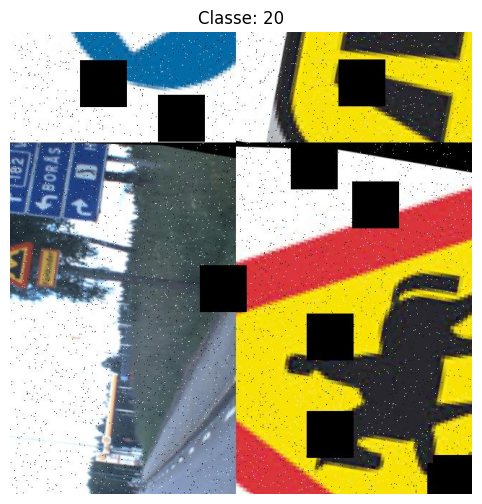

Classe 88 (Image: 97129819-c29-1_jpg.rf.35252b2807d4d8555f43acb16ea835f9.jpg)


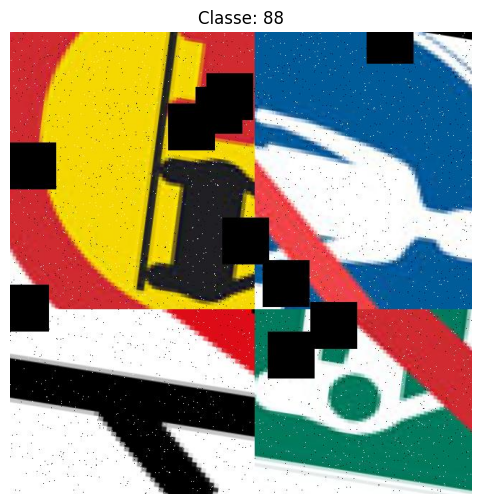

Classe 88 (Image: b710c232-e33-cykelgata_jpg.rf.341927b820a77b20cade6806f53ed697.jpg)


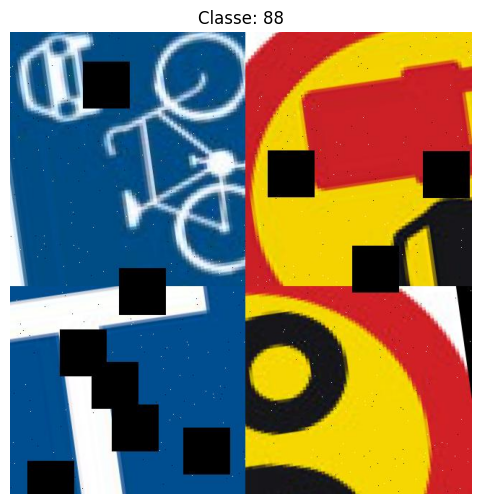

Classe 88 (Image: sign57_jpg.rf.947d87ddcbe8407310a11cfbf7dffdbd.jpg)


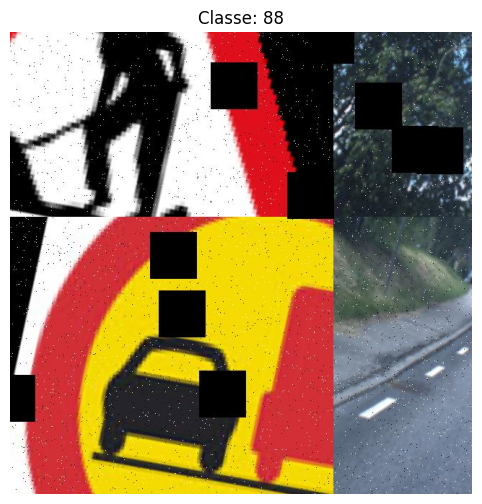

Classe 88 (Image: ab01d3eb-a41_jpg.rf.c8906d7845a1df4367d76dc50316bc9a.jpg)


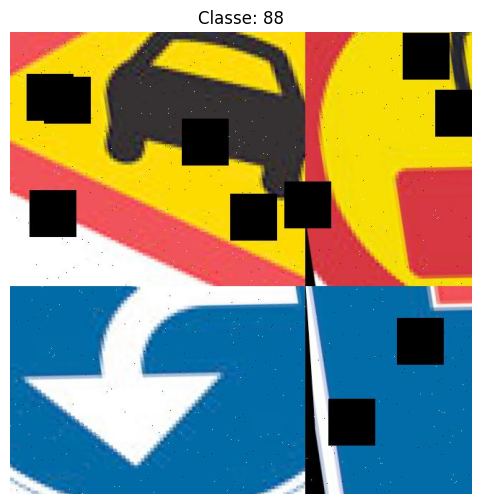

Classe 88 (Image: 88856a02-g10_jpg.rf.102686d1459c5cd63adaf7ae9e070bba.jpg)


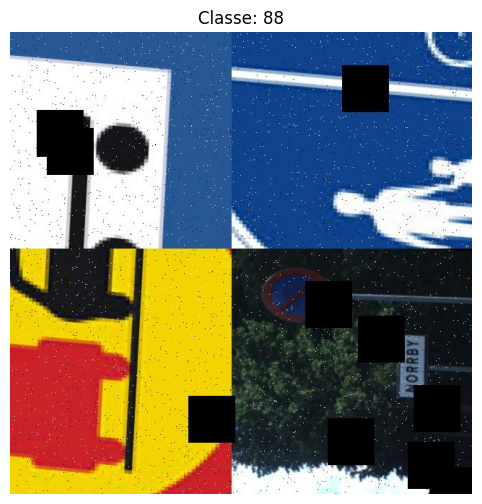

Classe 113 (Image: 9bfb8dc2-a29-2_jpg.rf.183a95cb530b0247f2cf9f494a4a6257.jpg)


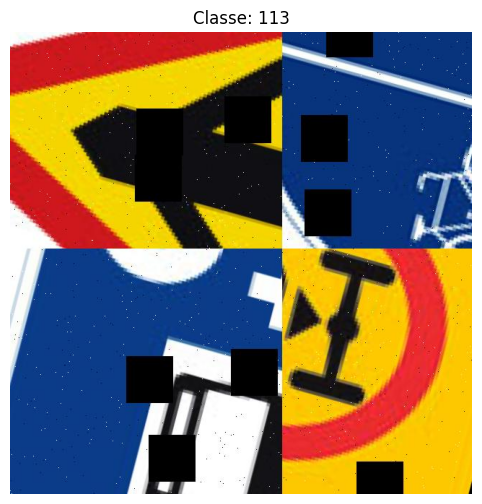

Classe 113 (Image: 680c3eae-e20-10_jpg.rf.eabf579975d3bd1f74f08cea1c0e9b9f.jpg)


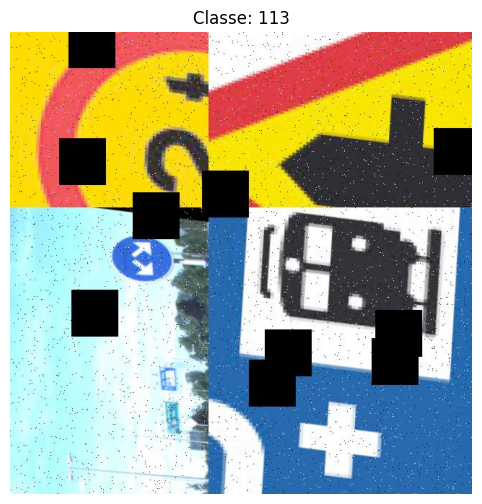

Classe 113 (Image: a3b60166-1277105440Image000051_jpg.rf.9c70a714e6777925ddf68edfab1b28dc.jpg)


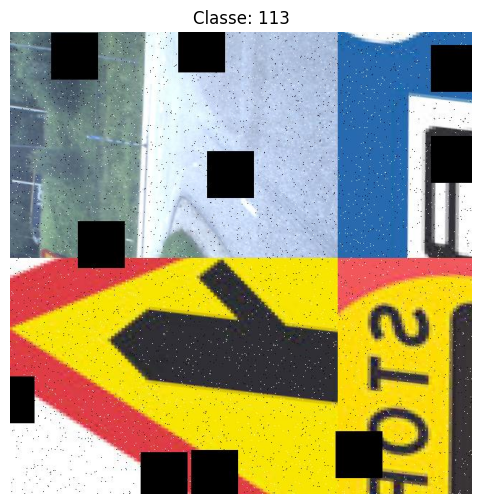

Classe 113 (Image: 7c27e1f4-f5-1_jpg.rf.4114971f53a605d634f09af651ce7814.jpg)


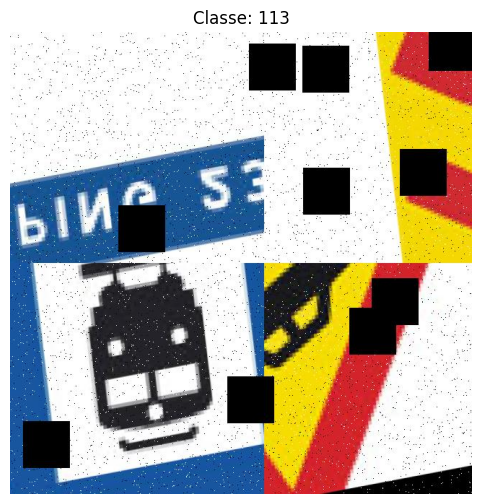

Classe 113 (Image: 26ebb12c-t7-9_jpg.rf.dc40ce70fde120615cd592180321f06d.jpg)


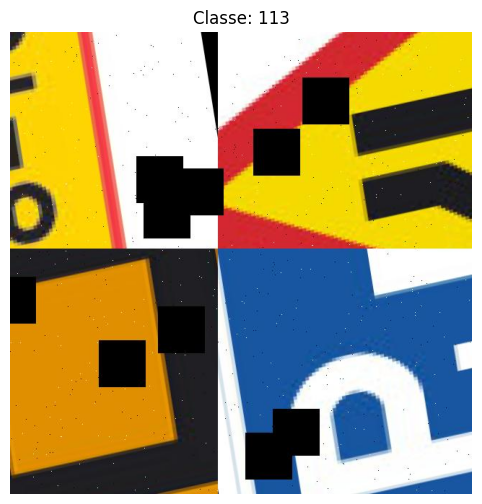

Classe 35 (Image: 4103041f-d2-2_jpg.rf.b8ce124a0ad2fe331f53a2fbc057b5fc.jpg)


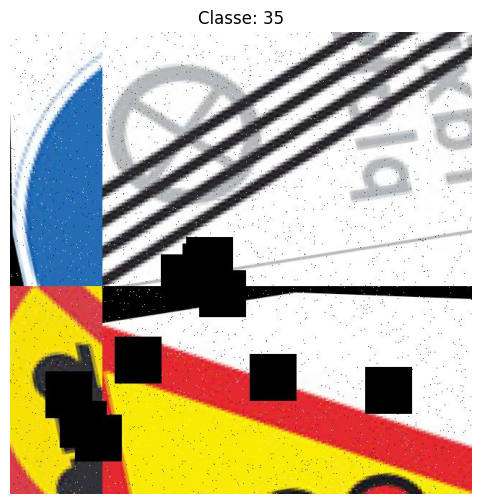

Classe 35 (Image: 753958cd-c36-1_jpg.rf.964ee076c9165b3fdd152342d9ce3ade.jpg)


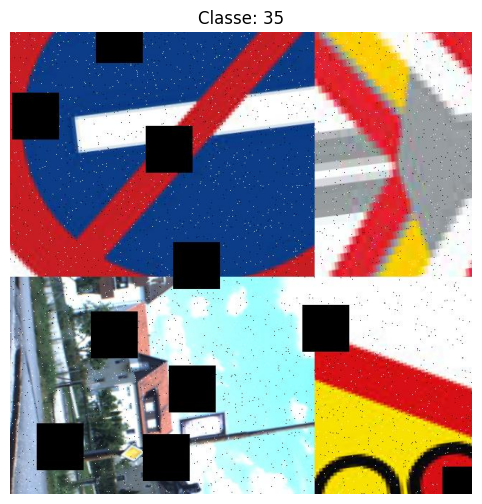

Classe 35 (Image: 53454a40-a22-1_jpg.rf.e639bfc68eadc91c4d0b119495ca77c2.jpg)


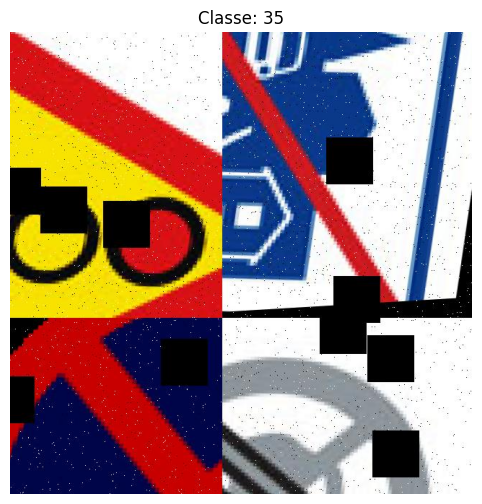

Classe 35 (Image: 53454a40-a22-1_jpg.rf.e7943f6e1f9e932534ca340abe629787.jpg)


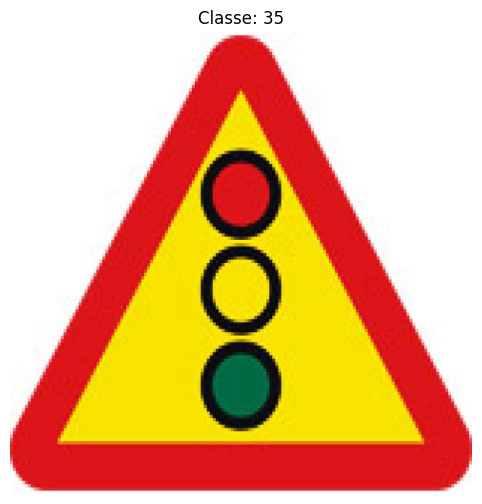

Classe 35 (Image: 7aa909aa-e19-1_jpg.rf.a90f15f0dc44eb3b840e2e9e4fdb42e2.jpg)


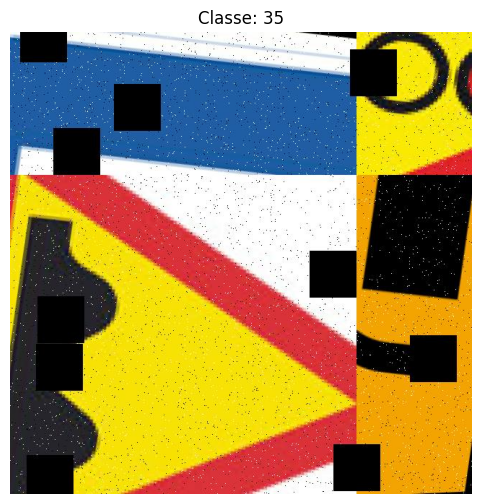

Classe 1 (Image: 12ae0705-1277387014Image000012_jpg.rf.4d6aee2675b07f47afe6242c56e230f9.jpg)


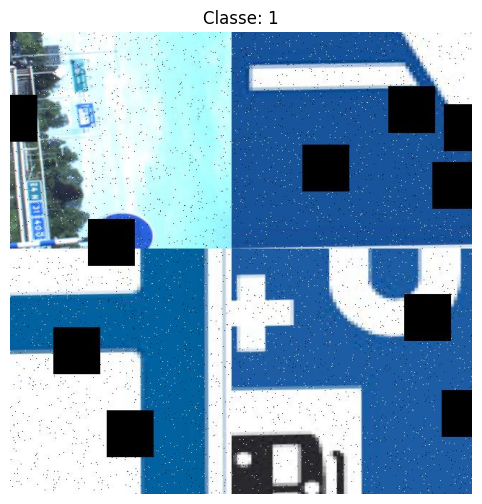

Classe 1 (Image: ef2a5606-a25_jpg.rf.a7c542cd12044e480e8f0f414d6478c1.jpg)


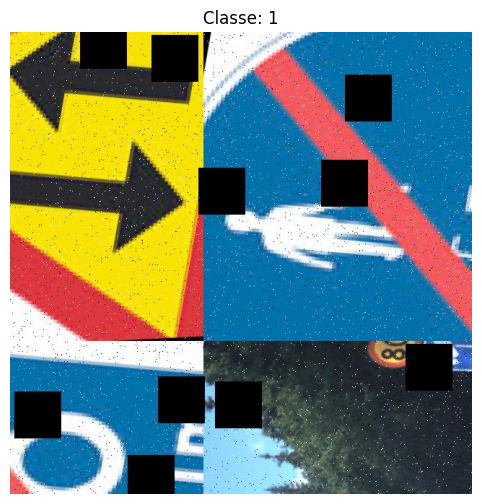

Classe 1 (Image: 8e639bb1-f18-1_jpg.rf.f2d3684556c91207baff8b5271074fd7.jpg)


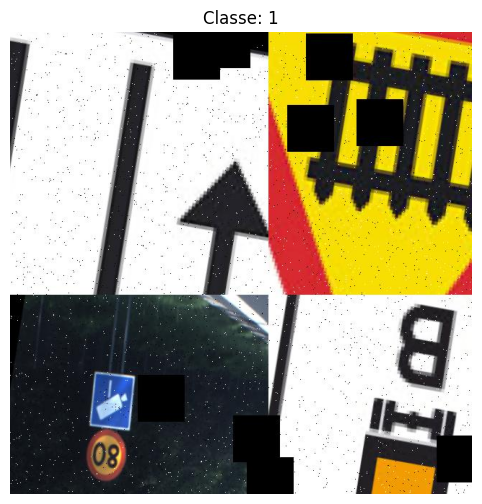

Classe 1 (Image: bc4ba7ca-a11-1_jpg.rf.56d829a2648631064e471b9e45b21eaa.jpg)


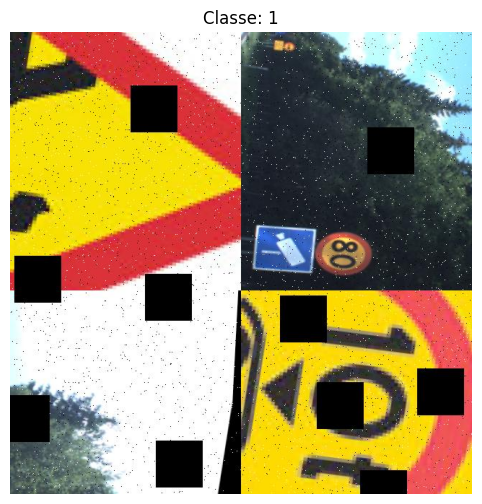

Classe 1 (Image: a809ef3e-e20-13_jpg.rf.796c0bdbbb823407d6d108a5498fe5bd.jpg)


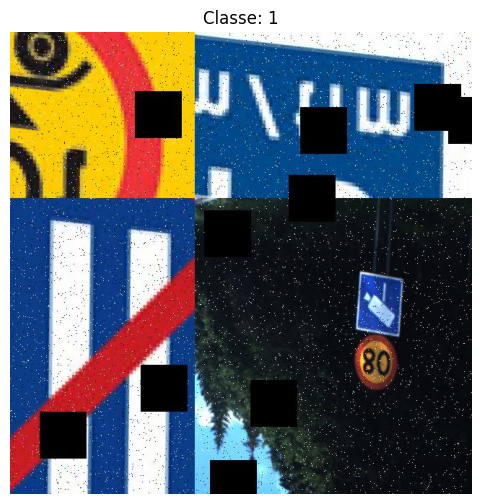

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import random

def afficher_images_pour_classes_aleatoires(chemin_images, chemin_labels, classes_cibles, nb_images=5):
    images_par_classe = {class_id: [] for class_id in classes_cibles}

    for fichier_label in os.listdir(chemin_labels):
        if not fichier_label.endswith(".txt"):
            continue

        base_name = fichier_label.replace(".txt", "")
        jpg_path = os.path.join(chemin_images, base_name + ".jpg")
        png_path = os.path.join(chemin_images, base_name + ".png")

        chemin_image = None
        if os.path.exists(jpg_path):
            chemin_image = jpg_path
        elif os.path.exists(png_path):
            chemin_image = png_path
        else:
            continue

        with open(os.path.join(chemin_labels, fichier_label), "r") as f:
            lignes = f.readlines()
            for ligne in lignes:
                parties = ligne.strip().split()
                if len(parties) == 5:
                    class_id = int(parties[0])
                    if class_id in classes_cibles:
                        images_par_classe[class_id].append(chemin_image)

    classes_a_afficher = random.sample(classes_cibles, min(len(classes_cibles), 5))

    for class_id in classes_a_afficher:
        images_a_afficher = random.sample(images_par_classe.get(class_id, []), min(nb_images, len(images_par_classe[class_id])))
        for chemin_image in images_a_afficher:
            if chemin_image is not None:
                print(f"Classe {class_id} (Image: {os.path.basename(chemin_image)})")
                img = cv2.imread(chemin_image)
                if img is not None:
                    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    plt.figure(figsize=(8, 6))
                    plt.imshow(img_rgb)
                    plt.title(f"Classe: {class_id}")
                    plt.axis("off")
                    plt.show()
            else:
                print(f"Aucune image trouvée pour la classe {class_id}.")

# Exemple d'utilisation
chemin_images = "/content/drive/MyDrive/DATASIGNALISATION/train/images"
chemin_labels = "/content/drive/MyDrive/DATASIGNALISATION/train/labels"
classes_cibles = list(range(0, 146))  # IDs de 0 à 146
afficher_images_pour_classes_aleatoires(chemin_images, chemin_labels, classes_cibles, nb_images=5)


# Affichage d'images aléatoires pour 5 classes.

# Fonction Affichage et Analyse

In [ ]:
def analyser_distribution(chemin_labels):
    comptage = Counter()
    for f in os.listdir(chemin_labels):
        if f.endswith(".txt"):
            with open(os.path.join(chemin_labels, f), 'r') as lbl:
                lignes = lbl.readlines()
                for ligne in lignes:
                    parties = ligne.strip().split()
                    if len(parties) == 5:
                        cls_id = parties[0]
                        comptage[cls_id] += 1
    return comptage

def afficher_distribution_classes(compte_classes, titre="Distribution des classes"):
    plt.figure(figsize=(12, 6))
    classes = list(compte_classes.keys())
    occurrences = list(compte_classes.values())

    plt.bar(classes, occurrences, color='skyblue')
    plt.title(titre)
    plt.xlabel("Classe")
    plt.ylabel("Occurrences")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

def afficher_image_aleatoire(chemin_images, chemin_labels, nb_aleatoires=1):
    tous_labels = [f for f in os.listdir(chemin_labels) if f.endswith('.txt')]
    if not tous_labels:
        print("Aucun label .txt trouvé.")
        return

    labels_choisis = random.sample(tous_labels, min(nb_aleatoires, len(tous_labels)))

    for fichier_lbl in labels_choisis:
        nom_base = fichier_lbl.replace('.txt', '')
        chemin_jpg = os.path.join(chemin_images, nom_base + '.jpg')
        chemin_png = os.path.join(chemin_images, nom_base + '.png')

        if os.path.exists(chemin_jpg):
            chemin_img = chemin_jpg
        elif os.path.exists(chemin_png):
            chemin_img = chemin_png
        else:
            print(f"Pas d'image pour {fichier_lbl}")
            continue

        img = cv2.imread(chemin_img)
        if img is None:
            print(f"Impossible de lire l'image {chemin_img}")
            continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        H, W, _ = img.shape

        fig, ax = plt.subplots(1, figsize=(8,6))
        ax.imshow(img_rgb)
        ax.set_title(f"Image: {nom_base}")

        chemin_lbl = os.path.join(chemin_labels, fichier_lbl)
        with open(chemin_lbl, 'r') as f:
            lignes = f.readlines()

        for ligne in lignes:
            parties = ligne.strip().split()
            if len(parties) != 5:
                continue
            cls_id, x_c, y_c, w, h = parties
            try:
                x_c, y_c, w, h = float(x_c), float(y_c), float(w), float(h)
            except ValueError:
                continue

            box_w = w * W
            box_h = h * H
            box_x = (x_c - w/2) * W
            box_y = (y_c - h/2) * H

            rect = plt.Rectangle(
                (box_x, box_y),
                box_w, box_h,
                edgecolor='red', facecolor='none', linewidth=2
            )
            ax.add_patch(rect)
            ax.text(box_x, box_y-5, f"Cls {cls_id}", color='red', backgroundcolor='white', fontsize=9)

        plt.axis('off')
        plt.tight_layout()
        plt.show()


# 2. Nettoyage Préliminaire des Données
Ici :     
1- On Supprime les images corrompues ou introuvables (on s’assure qu’à chaque fichier .txt correspond bien une image .jpg/.png).

2- On vérifie que nos annotations n’ont pas de valeurs aberrantes (exemple: x_center en dehors de 0,1, etc).

3- On Filtre si on repère des doublons ou des fichers quasi-identiques.

4- On détecte si la bounding box est trop petite / trop grande pour être pertinente.

5- On détecte s’il n’y a pas de bounding box dans un fichier .txt et on le supprime.

In [ ]:
def nettoyer_donnees(chemin_img_src, chemin_lbl_src, chemin_img_dst, chemin_lbl_dst):
    nb_txt_supprimes = 0
    nb_txt_conserves = 0
    nb_img_conserves = 0
    nb_img_supprimes = 0

    os.makedirs(chemin_img_dst, exist_ok=True)
    os.makedirs(chemin_lbl_dst, exist_ok=True)

    fichiers_txt = [f for f in os.listdir(chemin_lbl_src) if f.endswith(".txt")]

    for fichier_lbl in fichiers_txt:
        chemin_lbl = os.path.join(chemin_lbl_src, fichier_lbl)
        nom_base = fichier_lbl.replace('.txt', '')
        chemin_jpg = os.path.join(chemin_img_src, nom_base + '.jpg')
        chemin_png = os.path.join(chemin_img_src, nom_base + '.png')

        if os.path.exists(chemin_jpg):
            chemin_img = chemin_jpg
        elif os.path.exists(chemin_png):
            chemin_img = chemin_png
        else:
            nb_txt_supprimes += 1
            print(f"[NETTOYAGE] Orphelin: supprime/ignore le label {fichier_lbl} (pas d'image).")
            continue

        with open(chemin_lbl, 'r') as f:
            lignes = f.readlines()

        lignes_valides = []
        for ligne in lignes:
            parties = ligne.strip().split()
            if len(parties) != 5:
                continue

            cls_id, x_c, y_c, w, h = parties
            try:
                _cls = int(cls_id)
                _x = float(x_c)
                _y = float(y_c)
                _w = float(w)
                _h = float(h)
            except ValueError:
                continue

            if not (0 <= _x <= 1 and 0 <= _y <= 1 and 0 <= _w <= 1 and 0 <= _h <= 1):
                continue

            if _w < 0.001 or _h < 0.001 or _w > 0.99 or _h > 0.99:
                continue

            lignes_valides.append(ligne)

        if len(lignes_valides) == 0:
            nb_txt_supprimes += 1
            print(f"[NETTOYAGE] Corrompu/vidé => on ignore {fichier_lbl}, pas de copie.")
            continue

        chemin_img_dst_final = os.path.join(chemin_img_dst, os.path.basename(chemin_img))
        chemin_lbl_dst_final = os.path.join(chemin_lbl_dst, fichier_lbl)

        shutil.copy(chemin_img, chemin_img_dst_final)
        with open(chemin_lbl_dst_final, 'w') as fw:
            fw.writelines(lignes_valides)
        nb_img_conserves += 1
        nb_txt_conserves += 1


    fichiers_images = [f for f in os.listdir(chemin_img_src) if f.lower().endswith(('.jpg', '.png'))]
    for fichier_img in fichiers_images:
        nom_base = os.path.splitext(fichier_img)[0]
        chemin_lbl_potentiel = os.path.join(chemin_lbl_src, nom_base + ".txt")

        if not os.path.exists(chemin_lbl_potentiel):
            nb_img_supprimes += 1
            print(f"[NETTOYAGE] Image orpheline : {fichier_img} (pas de .txt associé), ignorée.")

    print(f"[NETTOYAGE] {nb_txt_supprimes} labels invalides ou orphelins ignorés.")
    print(f"[NETTOYAGE] {nb_txt_conserves} labels valides copiés.")
    print(f"[NETTOYAGE] {nb_img_conserves} images associées copiées.")
    print(f"[NETTOYAGE] {nb_img_supprimes} images orphelines ignorées.")
    print("[NETTOYAGE] Nettoyage terminé.\n")


Ce code de nottoyage nous assure que jusqu’à la fin, on ne garde que des paires (image, label) valides et que les bounding boxes sont cohérentes.

# Explication plus detaillé des etapes de nettoyage de nos données:

Vérification de la correspondance .txt -> .jpg/.:
- Pour chaque fichier .txt, on tente de trouver le fichier image correspondant (*.jpg ou *.png).
- Si aucune image n’existe, on supprime le label : cela nous évite d’entraîner le modèle sur des annotations sans image.

Lecture et parsing des bounding boxes :
- Chaque annotation doit avoir exactement 5 tokens classe + 4 floats en YOLO.
- La classe doit être convertible en int, sinon c’est concidéré comme corrompu
Les coordonnées (x_center, y_center, width, height) doivent être convertibles en float, sinon c’est aussi corrompu
- Elles doivent tomber dans l’intervalle 0,1 telque le format YOLO.
- On  ignore les bounding boxes trop petites (bruit) ou trop grandes (erreur) pour maximiser la précision.

Images sans label:
- De la même façon pour chaque image, on vérifie l’existence du label. Si on ne trouve pas de fichier .txt, on supprime l’image.
Ceci nous assure un 1-à-1 complet ou chaque image a un label, chaque label a une imag


# Exécution De chacune des étapes :

===== AVANT NETTOYAGE =====


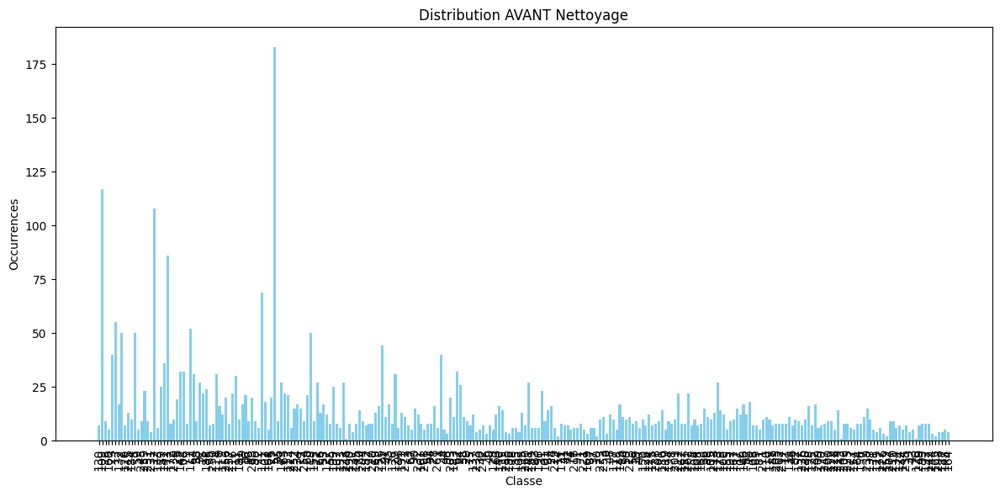

===== NETTOYAGE EN COURS... =====
[NETTOYAGE] Corrompu/vidé => on ignore 32ce523a-f15-1_jpg.rf.f38781001811728384cfcd20281313c6.txt, pas de copie.
[NETTOYAGE] Corrompu/vidé => on ignore 39061aaa-f23-1_jpg.rf.9d1ad542dcbe2e796dd970d9a6049b1f.txt, pas de copie.
[NETTOYAGE] Corrompu/vidé => on ignore 4103041f-d2-2_jpg.rf.b927f6865f666109bad780c829dc3cf7.txt, pas de copie.
[NETTOYAGE] Corrompu/vidé => on ignore 467db011-g8-1_jpg.rf.ac55902358665fa04647cb822d7d0a6f.txt, pas de copie.
[NETTOYAGE] Corrompu/vidé => on ignore 41894a2b-a10-1_jpg.rf.bc2af4e6f561f5c196f37014743fcd86.txt, pas de copie.
[NETTOYAGE] Corrompu/vidé => on ignore 4012e091-e21-3_jpg.rf.0f60341b64ee2242af183bbc9c693914.txt, pas de copie.
[NETTOYAGE] Corrompu/vidé => on ignore 49d461c6-e20-3_jpg.rf.b3b0c2db926df67d47debf3caddc2bb6.txt, pas de copie.
[NETTOYAGE] Corrompu/vidé => on ignore 47eadbc4-t7-8_jpg.rf.acb9c41043f73769ce7ebc25cf104fc6.txt, pas de copie.
[NETTOYAGE] Corrompu/vidé => on ignore 498a35dc-t7-5_jpg.rf.e3c3d

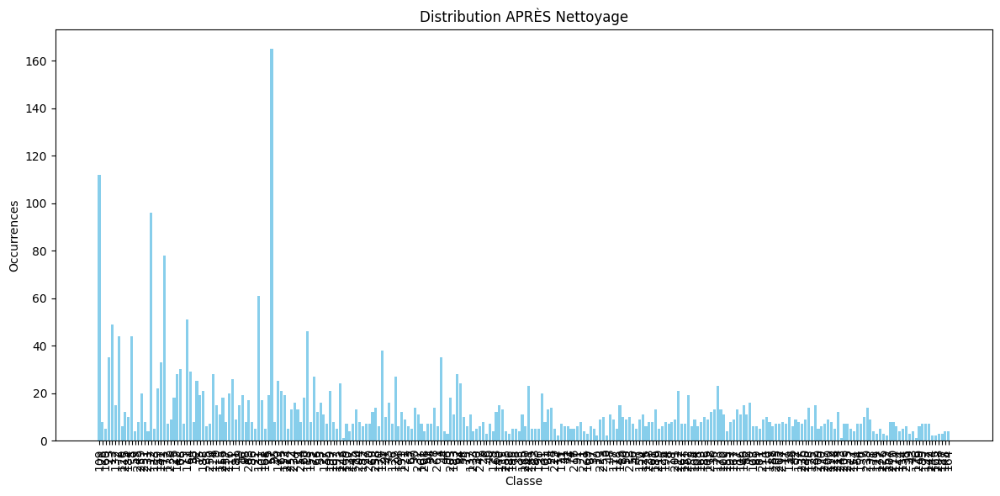

===== AFFICHAGE D'UNE IMAGE AVEC BOUNDING BOXES AVANT/APRÈS =====


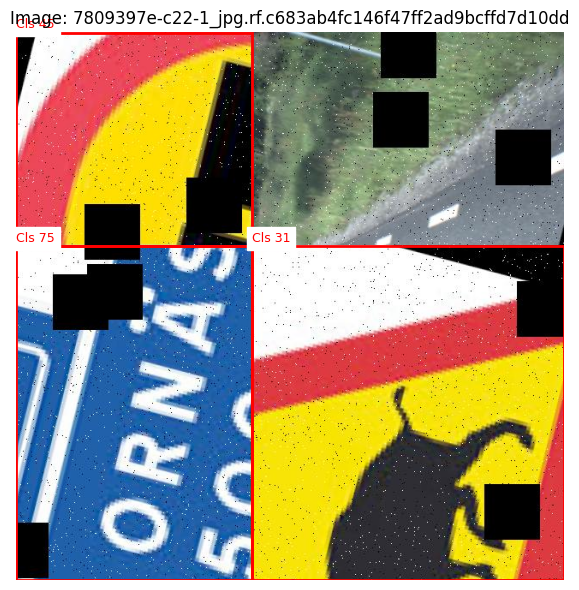

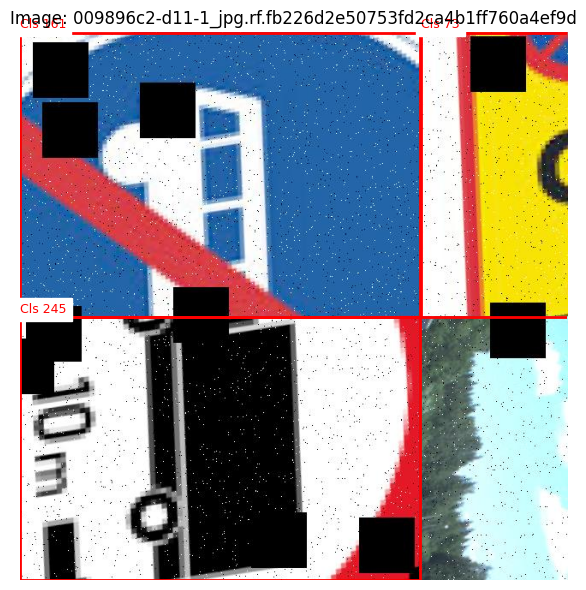

In [ ]:
print("===== AVANT NETTOYAGE =====")
compte_avant = analyser_distribution(TRAIN_LABEL)
afficher_distribution_classes(compte_avant, "Distribution AVANT Nettoyage")

print("===== NETTOYAGE EN COURS... =====")
nettoyer_donnees(
    chemin_img_src=TRAIN_IMAGE,
    chemin_lbl_src=TRAIN_LABEL,
    chemin_img_dst=IMG_NETTOY,
    chemin_lbl_dst=LBL_NETTOY
)

print("===== APRÈS NETTOYAGE =====")
compte_apres = analyser_distribution(LBL_NETTOY)
afficher_distribution_classes(compte_apres, "Distribution APRÈS Nettoyage")

print("===== AFFICHAGE D'UNE IMAGE AVEC BOUNDING BOXES AVANT/APRÈS =====")
afficher_image_aleatoire(TRAIN_IMAGE, TRAIN_LABEL, nb_aleatoires=1)
afficher_image_aleatoire(IMG_NETTOY, LBL_NETTOY, nb_aleatoires=1)

#Résumé de la Distribution avant  Nettoyage

- Total des classes présentes : 264 classes.

- Classe la plus fréquente : Classe 57 avec 177 occurrences.

- Classe la moins fréquente : Classe 176 avec 1 occurrence.

#Résumé de la Distribution avant  Nettoyage
- Total des classes présentes : 264 classes.

- Classe la plus fréquente : Classe 57 avec 165 occurrences.

- Classe la moins fréquente : Classe 176 avec 1 occurrence.

- Objectif atteint : Le nettoyage a permis de réduire les anomalies et de normaliser la répartition.

In [ ]:
import os
import cv2
import random
import albumentations as A

# Définition des classes "arrow" (pour lesquelles on exclut la rotation)
arrow_classes = [
    "Turn Right",
    "Turn left ahead",
    "Turn left or straight ahead",
    "Turn right ahead",
    "Straight ahead",
    "Keep left",
    "Keep right",
    "Left curve",
    "Right curve",
    "U-turn",
    "No Left turn",
    "No Right turn",
    "No U turn"
]

def augmenter_classes_rares(img_src, lbl_src, img_dst, lbl_dst, classes_rares, nb_augmentations=7):
    os.makedirs(img_dst, exist_ok=True)
    os.makedirs(lbl_dst, exist_ok=True)

    # Pipeline pour les classes avec rotation
    augmenter_general = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.Rotate(limit=15, p=0.5),
        A.GaussianBlur(p=0.1)
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

    # Pipeline pour les classes "arrow" (sans rotation)
    augmenter_arrow = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.GaussianBlur(p=0.1)
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

    for fichier in os.listdir(lbl_src):
        if fichier.endswith(".txt"):
            chemin_lbl = os.path.join(lbl_src, fichier)
            base = fichier.replace('.txt', '')
            chemin_img = None
            for ext in ['.jpg', '.png']:
                chemin_candidat = os.path.join(img_src, base + ext)
                if os.path.exists(chemin_candidat):
                    chemin_img = chemin_candidat
                    break
            if not chemin_img:
                continue

            with open(chemin_lbl, 'r') as lbl:
                annotations = lbl.readlines()

            rares = [ann for ann in annotations if ann.split()[0] in classes_rares]
            if not rares:
                continue

            img = cv2.imread(chemin_img)
            if img is None:
                continue

            H, W, _ = img.shape

            for _ in range(nb_augmentations):
                # Séparer les classes "arrow" des autres
                arrow_annotations = [ann for ann in rares if ann.split()[0] in arrow_classes]
                other_annotations = [ann for ann in rares if ann.split()[0] not in arrow_classes]

                img_aug = img.copy()
                bboxes = []
                classes = []

                # Augmentation pour les classes "arrow" (sans rotation)
                if arrow_annotations:
                    result_arrow = augmenter_arrow(
                        image=img_aug,
                        bboxes=[list(map(float, r.split()[1:])) for r in arrow_annotations],
                        class_labels=[r.split()[0] for r in arrow_annotations]
                    )
                    img_aug = result_arrow['image']
                    bboxes += result_arrow['bboxes']
                    classes += result_arrow['class_labels']

                # Augmentation pour les autres classes (avec rotation)
                if other_annotations:
                    result_general = augmenter_general(
                        image=img_aug,
                        bboxes=[list(map(float, r.split()[1:])) for r in other_annotations],
                        class_labels=[r.split()[0] for r in other_annotations]
                    )
                    img_aug = result_general['image']
                    bboxes += result_general['bboxes']
                    classes += result_general['class_labels']

                # Sauvegarder l'image augmentée
                nom_aug = f"{base}_aug_{random.randint(1000, 9999)}.jpg"
                chemin_img_aug = os.path.join(img_dst, nom_aug)
                chemin_lbl_aug = os.path.join(lbl_dst, nom_aug.replace('.jpg', '.txt'))

                cv2.imwrite(chemin_img_aug, img_aug)

                # Sauvegarder les annotations augmentées
                with open(chemin_lbl_aug, 'w') as lbl_aug:
                    for cls, box in zip(classes, bboxes):
                        lbl_aug.write(f"{cls} {' '.join(map(str, box))}\n")

def pipeline_equilibrage(img_net, lbl_net, img_bal, lbl_bal, seuil_rare=20):
    distrib = analyser_distribution(lbl_net)
    classes_rares = [cls for cls, cnt in distrib.items() if cnt < seuil_rare]
    print(f"Classes rares avec <{seuil_rare} occurrences : {classes_rares}")
    augmenter_classes_rares(img_net, lbl_net, img_bal, lbl_bal, classes_rares)
    distrib_post = analyser_distribution(lbl_bal)
    afficher_distribution_classes(distrib_post, "Distribution après augmentation")

Classes rares avec <20 occurrences : ['76', '160', '132', '120', '215', '184', '59', '245', '251', '231', '133', '172', '230', '26', '79', '38', '15', '35', '250', '9', '115', '256', '257', '181', '49', '16', '98', '263', '86', '22', '102', '168', '25', '95', '113', '224', '252', '234', '19', '254', '60', '153', '66', '53', '127', '55', '107', '193', '246', '190', '237', '145', '20', '204', '182', '27', '220', '69', '258', '130', '97', '45', '136', '93', '191', '222', '3', '67', '90', '232', '161', '208', '51', '94', '28', '261', '44', '96', '203', '183', '58', '75', '137', '233', '30', '242', '29', '6', '40', '128', '63', '140', '135', '255', '186', '185', '78', '33', '195', '260', '189', '83', '196', '101', '84', '24', '229', '14', '171', '41', '42', '74', '216', '91', '1', '221', '169', '87', '37', '10', '223', '253', '0', '48', '117', '178', '143', '80', '50', '213', '56', '47', '150', '124', '175', '238', '61', '180', '219', '126', '194', '8', '18', '201', '162', '151', '262', '15

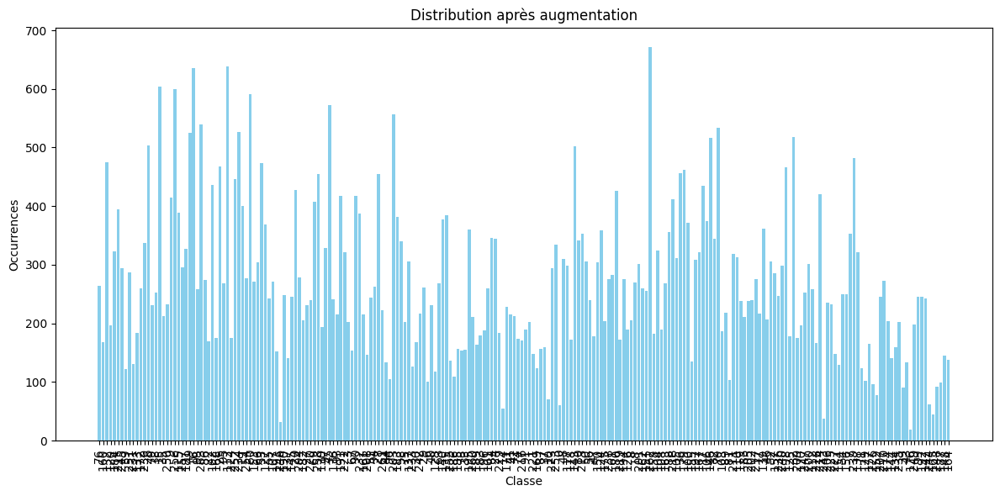

In [ ]:
# Lancer le pipeline
pipeline_equilibrage(IMG_NETTOY, LBL_NETTOY, IMG_AUGM, LBL_AUGM, seuil_rare=20)

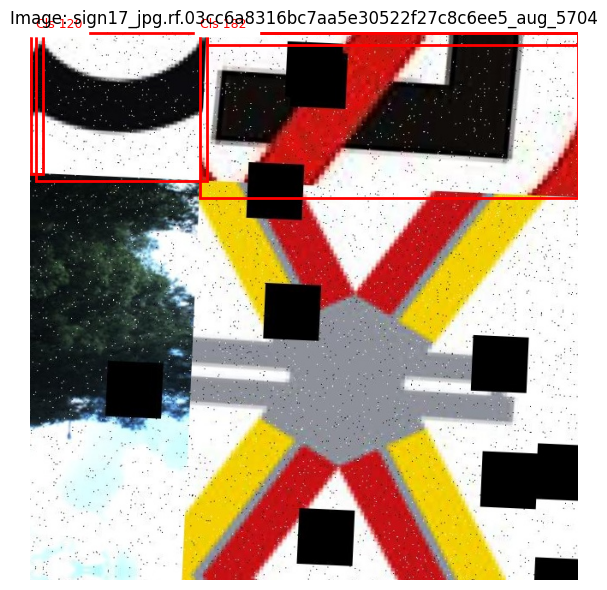

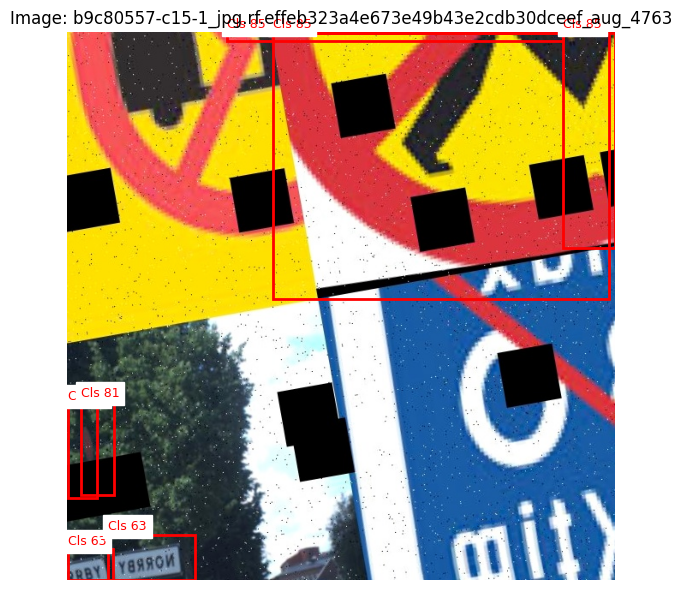

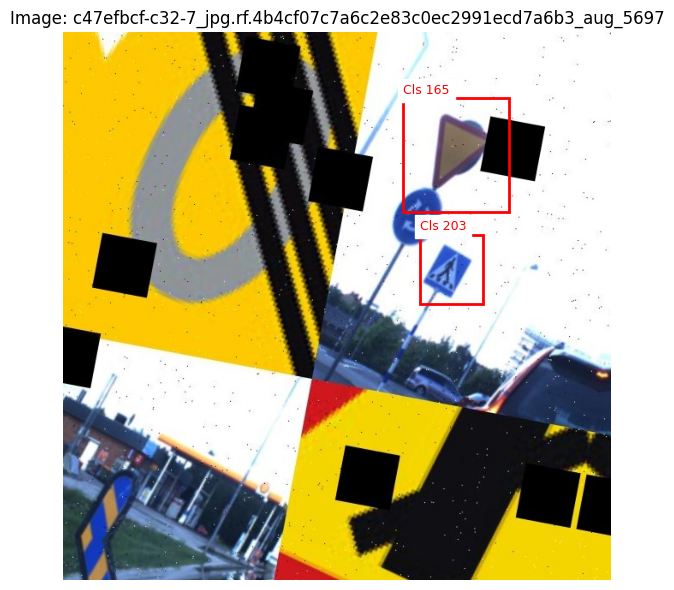

In [ ]:
afficher_image_aleatoire(IMG_AUGM, LBL_AUGM, nb_aleatoires=3)

In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 910.1/910.1 kB 20.4 MB/s eta 0:00:00


In [ ]:
import yaml

In [ ]:
def diviser_dataset(chemin_img, chemin_lbl, chemin_final, proportions=(0.7, 0.2, 0.1)):

    fichiers_lbl = [f for f in os.listdir(chemin_lbl) if f.endswith(".txt")]
    random.shuffle(fichiers_lbl)

    taille_total = len(fichiers_lbl)
    taille_train = int(proportions[0] * taille_total)
    taille_val = int(proportions[1] * taille_total)

    splits = {
        "train": fichiers_lbl[:taille_train],
        "val": fichiers_lbl[taille_train:taille_train + taille_val],
        "test": fichiers_lbl[taille_train + taille_val:]
    }

    for split, fichiers in splits.items():
        chemin_img_split = os.path.join(chemin_final, split, "images")
        chemin_lbl_split = os.path.join(chemin_final, split, "labels")

        os.makedirs(chemin_img_split, exist_ok=True)
        os.makedirs(chemin_lbl_split, exist_ok=True)

        for fichier_lbl in fichiers:
            chemin_lbl_src = os.path.join(chemin_lbl, fichier_lbl)
            chemin_lbl_dst = os.path.join(chemin_lbl_split, fichier_lbl)

            base_name = os.path.splitext(fichier_lbl)[0]
            chemin_img_src = None
            for ext in ['.jpg', '.png']:
                chemin_candidat = os.path.join(chemin_img, base_name + ext)
                if os.path.exists(chemin_candidat):
                    chemin_img_src = chemin_candidat
                    break

            if chemin_img_src is not None:
                chemin_img_dst = os.path.join(chemin_img_split, os.path.basename(chemin_img_src))
                shutil.copy(chemin_lbl_src, chemin_lbl_dst)
                shutil.copy(chemin_img_src, chemin_img_dst)
            else:
                print(f"[WARNING] Image manquante pour l'annotation : {fichier_lbl}")

    print(f"Dataset divisé avec succès :")
    for split, fichiers in splits.items():
        print(f" - {split}: {len(fichiers)} fichiers")


# Exemple d'utilisation
diviser_dataset(
    chemin_img=IMG_AUGM,
    chemin_lbl=LBL_AUGM,
    chemin_final=REPERTOIRE_FINAL,
    proportions=(0.7, 0.2, 0.1)
)

Dataset divisé avec succès :
 - train: 10285 fichiers
 - val: 2938 fichiers
 - test: 1471 fichiers


In [4]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/DATASIGNALISATION/yolov10n.pt")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.59M/5.59M [00:00<00:00, 84.9MB/s]


In [ ]:
model.train(data="/content/drive/MyDrive/DATASIGNALISATION/data.yaml",
            epochs=50,
            imgsz=640,
            batch=16,
            name="YOLOv10n_training")

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/DATASIGNALISATION/yolov10n.pt, data=/content/drive/MyDrive/DATASIGNALISATION/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv10n_training3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False,

train: Scanning /content/drive/MyDrive/DATASIGNALISATION/train/labels... 1174 images, 141 backgrounds, 0 corrupt: 100%|██████████| 1314/1314 [00:23<00:00, 55.89it/s] 

train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/306dc033-d1-2_jpg.rf.63ab6735367edc2baa4410d27c492903.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/54784ce7-e21-13_jpg.rf.8912fde49cf026f923ad5b1827c36434.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/5d579e2a-a29-3_jpg.rf.3c1005e341f42b3f6dcb1b03ac39cf18.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/670c5ae6-e31-4_jpg.rf.b6f6963748163c68af79d7796db9dbfd.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/sign4_jpg.rf.552334b8dffc9d619eed7cb9389a0314.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/sign4_jpg.rf.7bc9256bfd7c3e180f73e9e30a9dbf5e.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train

train: New cache created: /content/drive/MyDrive/DATASIGNALISATION/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/DATASIGNALISATION/valid/labels... 37 images, 2 backgrounds, 0 corrupt: 100%|██████████| 39/39 [00:05<00:00,  7.49it/s]

val: New cache created: /content/drive/MyDrive/DATASIGNALISATION/valid/labels.cache


Plotting labels to runs/detect/YOLOv10n_training3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=3.7e-05, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/YOLOv10n_training3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.58G      1.574      11.84      2.624         19        640: 100%|██████████| 83/83 [00:28<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.20it/s]

                   all         39         70          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.58G      0.881       11.5      2.176         14        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]

                   all         39         70          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.57G     0.6868      11.31      2.073         10        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.09it/s]

                   all         39         70     0.0122     0.0244     0.0243    0.00728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.57G     0.6169      11.06      2.001         12        640: 100%|██████████| 83/83 [00:26<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.87it/s]

                   all         39         70    0.00957      0.115     0.0414     0.0226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.58G     0.6003      10.91      1.985          6        640: 100%|██████████| 83/83 [00:26<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.75it/s]

                   all         39         70      0.459     0.0244     0.0441     0.0267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.58G     0.5659      10.66      1.959         10        640: 100%|██████████| 83/83 [00:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.01it/s]

                   all         39         70      0.364     0.0348     0.0412     0.0288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.57G     0.5719       10.5      1.964         12        640: 100%|██████████| 83/83 [00:26<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.98it/s]

                   all         39         70      0.346     0.0348     0.0471     0.0338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.58G     0.5497      10.31      1.927          7        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.89it/s]

                   all         39         70      0.206     0.0708      0.045     0.0333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.57G     0.5687      10.13      1.928          6        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.79it/s]

                   all         39         70      0.301     0.0139     0.0318     0.0222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.58G     0.5803      10.07      1.935          4        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.83it/s]

                   all         39         70     0.0305      0.235     0.0681     0.0546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.56G     0.5532      9.815      1.916         12        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.92it/s]

                   all         39         70      0.128      0.174     0.0633     0.0528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.57G     0.5623      9.713      1.924          9        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.89it/s]

                   all         39         70     0.0281      0.223     0.0582     0.0485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.58G     0.5469      9.594      1.913          9        640: 100%|██████████| 83/83 [00:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.86it/s]

                   all         39         70    0.00428      0.204     0.0422     0.0291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.58G     0.5417      9.425      1.902         14        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.67it/s]

                   all         39         70     0.0298      0.238     0.0608     0.0491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.57G     0.5534      9.306      1.899         16        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.72it/s]

                   all         39         70      0.029      0.235     0.0644      0.052



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.57G     0.5564      9.149      1.899         10        640: 100%|██████████| 83/83 [00:26<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.86it/s]

                   all         39         70      0.031       0.25     0.0635     0.0536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.58G     0.5652      9.107      1.902          7        640: 100%|██████████| 83/83 [00:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.67it/s]

                   all         39         70     0.0161      0.238     0.0618     0.0516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.58G       0.53      9.056      1.889         12        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.70it/s]

                   all         39         70     0.0101      0.238     0.0458      0.034



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.57G     0.5389      8.925      1.884         13        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.63it/s]

                   all         39         70     0.0366       0.25     0.0958     0.0805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.58G     0.5539      8.735      1.896         17        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.81it/s]

                   all         39         70     0.0284      0.226     0.0606     0.0489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.58G     0.5539      8.828      1.895          7        640: 100%|██████████| 83/83 [00:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.70it/s]

                   all         39         70      0.032      0.238     0.0798     0.0625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.57G     0.5557      8.627      1.892         14        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.71it/s]

                   all         39         70     0.0182       0.25     0.0784     0.0613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.57G     0.5554      8.532      1.888         10        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.68it/s]

                   all         39         70    0.00963      0.238     0.0644     0.0498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.57G     0.5288      8.503      1.883         11        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.67it/s]

                   all         39         70     0.0222       0.25     0.0915     0.0735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.58G     0.5586      8.379       1.88         11        640: 100%|██████████| 83/83 [00:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.75it/s]

                   all         39         70       0.38      0.207     0.0979     0.0797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.58G     0.5669      8.379      1.907          4        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.71it/s]

                   all         39         70     0.0248      0.287     0.0945     0.0794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.57G     0.5167       8.26      1.876         10        640: 100%|██████████| 83/83 [00:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.69it/s]

                   all         39         70        0.4      0.149     0.0846     0.0657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.58G      0.537      8.169      1.872         20        640: 100%|██████████| 83/83 [00:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.74it/s]

                   all         39         70      0.422      0.058     0.0945     0.0779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.58G     0.5225      8.129      1.882          9        640: 100%|██████████| 83/83 [00:26<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.64it/s]

                   all         39         70      0.425     0.0544      0.116     0.0992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.58G     0.5371       8.05      1.868         13        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.82it/s]

                   all         39         70      0.374      0.113       0.12      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.57G     0.5333      8.107      1.896          6        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.73it/s]

                   all         39         70      0.412     0.0626      0.106     0.0882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.58G     0.5535      7.971      1.895          6        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.74it/s]

                   all         39         70      0.411     0.0682      0.101     0.0812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       4.4G     0.5234      8.028      1.884          7        640: 100%|██████████| 83/83 [00:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.73it/s]

                   all         39         70      0.384      0.119       0.11     0.0889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.58G      0.518      7.892      1.881         11        640: 100%|██████████| 83/83 [00:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.62it/s]

                   all         39         70      0.381      0.104     0.0951     0.0796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.56G     0.5102      7.901      1.868          9        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.74it/s]

                   all         39         70       0.44     0.0818     0.0961     0.0777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.58G     0.5232      7.866      1.875         13        640: 100%|██████████| 83/83 [00:26<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.68it/s]

                   all         39         70      0.411     0.0655      0.114     0.0932



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.57G     0.5411      7.822      1.884          9        640: 100%|██████████| 83/83 [00:26<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.70it/s]

                   all         39         70      0.414     0.0746      0.108     0.0892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.58G     0.5236      7.737      1.857          6        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.54it/s]

                   all         39         70      0.406     0.0668      0.117     0.0983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.56G     0.5128      7.744      1.864         10        640: 100%|██████████| 83/83 [00:26<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.64it/s]

                   all         39         70      0.455      0.131      0.129       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.58G     0.5273      7.711      1.872         11        640: 100%|██████████| 83/83 [00:26<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.76it/s]

                   all         39         70     0.0415      0.433      0.131      0.115


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.54G      0.545      9.294      1.887          1        640: 100%|██████████| 83/83 [00:27<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.68it/s]

                   all         39         70     0.0282      0.421      0.132      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.54G      0.499      8.791      1.857          5        640: 100%|██████████| 83/83 [00:26<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.68it/s]

                   all         39         70      0.426      0.186      0.122      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.53G     0.4807      8.698      1.852          8        640: 100%|██████████| 83/83 [00:26<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.54it/s]

                   all         39         70       0.56     0.0791      0.122      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.54G     0.4595      8.578      1.851          7        640: 100%|██████████| 83/83 [00:26<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.80it/s]

                   all         39         70       0.56      0.112      0.124      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.54G     0.4652      8.535      1.839          8        640: 100%|██████████| 83/83 [00:26<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.73it/s]

                   all         39         70      0.535      0.081      0.131      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.54G     0.4479      8.511      1.838          7        640: 100%|██████████| 83/83 [00:26<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.58it/s]

                   all         39         70      0.537      0.104      0.132      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.57G     0.4551      8.512      1.837          5        640: 100%|██████████| 83/83 [00:26<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.60it/s]

                   all         39         70      0.585     0.0978      0.143      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.54G     0.4643      8.446      1.829          5        640: 100%|██████████| 83/83 [00:26<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.51it/s]

                   all         39         70      0.558     0.0858      0.143      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.54G     0.4597      8.504      1.815          2        640: 100%|██████████| 83/83 [00:26<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.66it/s]

                   all         39         70      0.564      0.111      0.159      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.54G     0.4495      8.717      1.836          1        640: 100%|██████████| 83/83 [00:26<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.80it/s]

                   all         39         70       0.58     0.0782      0.153      0.137



50 epochs completed in 0.431 hours.
Optimizer stripped from runs/detect/YOLOv10n_training3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/YOLOv10n_training3/weights/best.pt, 6.2MB

Validating runs/detect/YOLOv10n_training3/weights/best.pt...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2,924,672 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.07it/s]


                   all         39         70      0.539       0.11      0.158      0.141
                     1          1          1          1          0          0          0
                   108          1          1          1          0      0.332       0.25
                   121          1          2          0          0          0          0
                   128          1          1          1          0     0.0553     0.0497
                   139          1          1          1          0     0.0216     0.0195
                   172          1          1          0          0     0.0221     0.0177
                   173          1          1          0          0          0          0
                   180          1          3     0.0764      0.333      0.147     0.0944
                   181          7          8      0.207      0.328      0.261      0.211
                    33          3          5          1          0          0          0
                    3

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([  1,   9,  20,  26,  34,  64,  65,  72,  73,  87,  90, 102, 109, 111, 117, 118, 140, 141, 152, 163, 164, 166, 168, 169, 176, 178, 183, 184, 200, 203, 212, 215, 217, 226, 230, 231, 233, 236, 237, 238, 257])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e4efc72e050>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033, 

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

def afficher_resultats_entraînement(log_dir):

    results_file = os.path.join(log_dir, "results.csv")

    try:
        results = pd.read_csv(results_file)
    except FileNotFoundError:
        print(f"[ERREUR] Le fichier {results_file} est introuvable.")
        return

    print("Colonnes disponibles dans results.csv :")
    print(results.columns.tolist())

    # Vérifier et tracer les pertes
    if {'train/box_loss', 'train/obj_loss', 'train/cls_loss'}.issubset(results.columns):
        plt.figure(figsize=(12, 6))
        plt.plot(results['epoch'], results['train/box_loss'], label="Perte de localisation (Box)", linestyle='-', marker='o')
        plt.plot(results['epoch'], results['train/obj_loss'], label="Perte d'objet (Obj)", linestyle='-', marker='o')
        plt.plot(results['epoch'], results['train/cls_loss'], label="Perte de classification (Cls)", linestyle='-', marker='o')
        plt.title("Évolution des pertes durant l'entraînement")
        plt.xlabel("Époque")
        plt.ylabel("Valeur de la perte")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        print("[INFO] Les colonnes des pertes ne sont pas disponibles.")

    # Vérifier et tracer la précision et le rappel
    if {'metrics/precision', 'metrics/recall'}.issubset(results.columns):
        plt.figure(figsize=(12, 6))
        plt.plot(results['epoch'], results['metrics/precision'], label="Précision", linestyle='-', marker='o', color='blue')
        plt.plot(results['epoch'], results['metrics/recall'], label="Rappel", linestyle='-', marker='o', color='green')
        plt.title("Précision et rappel durant l'entraînement")
        plt.xlabel("Époque")
        plt.ylabel("Valeurs")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        print("[INFO] Les colonnes de précision et de rappel ne sont pas disponibles.")

    # Vérifier et tracer la mAP
    if {'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95'}.issubset(results.columns):
        plt.figure(figsize=(12, 6))
        plt.plot(results['epoch'], results['metrics/mAP_0.5'], label="mAP@0.5", linestyle='-', marker='o', color='orange')
        plt.plot(results['epoch'], results['metrics/mAP_0.5:0.95'], label="mAP@0.5:0.95", linestyle='-', marker='o', color='red')
        plt.title("mAP durant l'entraînement")
        plt.xlabel("Époque")
        plt.ylabel("mAP")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        print("[INFO] Les colonnes de mAP ne sont pas disponibles.")

# Exemple d'utilisation
log_dir = "/content/runs/detect/YOLOv10n_training3"  # Modifiez ce chemin si nécessaire
afficher_resultats_entraînement(log_dir)


Colonnes disponibles dans results.csv :
['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']
[INFO] Les colonnes des pertes ne sont pas disponibles.
[INFO] Les colonnes de précision et de rappel ne sont pas disponibles.
[INFO] Les colonnes de mAP ne sont pas disponibles.


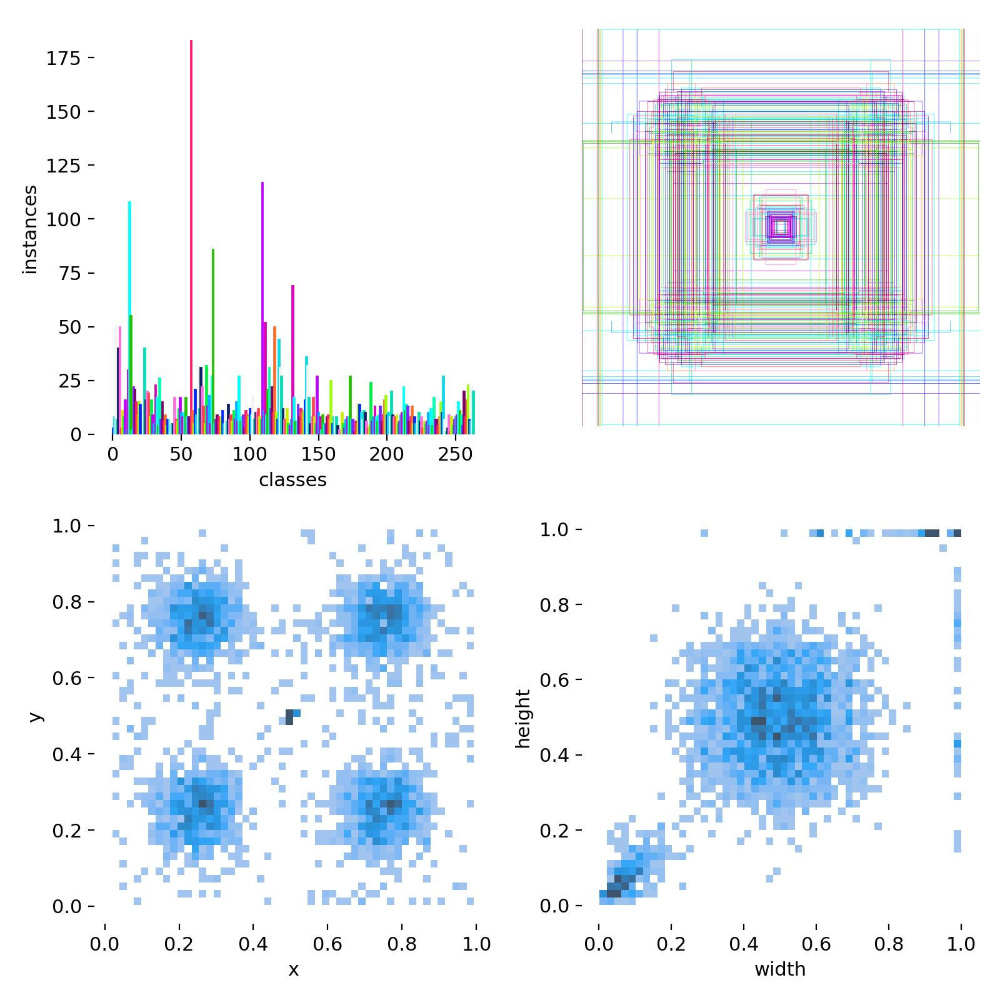

In [ ]:
model.train(data="/content/drive/MyDrive/DATASIGNALISATION/data.yaml",
            epochs=100,
            imgsz=640,
            batch=32,
            name="YOLOv10n_training")

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/DATASIGNALISATION/yolov10n.pt, data=/content/drive/MyDrive/DATASIGNALISATION/data.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv10n_training4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False

100%|██████████| 5.35M/5.35M [00:00<00:00, 101MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/DATASIGNALISATION/train/labels.cache... 1174 images, 141 backgrounds, 0 corrupt: 100%|██████████| 1314/1314 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/306dc033-d1-2_jpg.rf.63ab6735367edc2baa4410d27c492903.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/54784ce7-e21-13_jpg.rf.8912fde49cf026f923ad5b1827c36434.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/5d579e2a-a29-3_jpg.rf.3c1005e341f42b3f6dcb1b03ac39cf18.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/670c5ae6-e31-4_jpg.rf.b6f6963748163c68af79d7796db9dbfd.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/sign4_jpg.rf.552334b8dffc9d619eed7cb9389a0314.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/sign4_jpg.rf.7bc9256bfd7c3e180f73e9e30a9dbf5e.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train


val: Scanning /content/drive/MyDrive/DATASIGNALISATION/valid/labels.cache... 37 images, 2 backgrounds, 0 corrupt: 100%|██████████| 39/39 [00:00<?, ?it/s]


Plotting labels to runs/detect/YOLOv10n_training4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=3.7e-05, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/YOLOv10n_training4
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.89G     0.4758      7.745      1.855         10        640: 100%|██████████| 42/42 [01:07<00:00,  1.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         39         70      0.492      0.117      0.176      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.86G      0.524      7.604      1.877          5        640: 100%|██████████| 42/42 [00:26<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         39         70      0.033      0.445      0.161      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.88G     0.5224       7.45      1.861         17        640: 100%|██████████| 42/42 [00:26<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all         39         70      0.314      0.178      0.167      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      8.87G     0.5393      7.376      1.865         22        640: 100%|██████████| 42/42 [00:26<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70     0.0434      0.409      0.144      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      8.88G     0.5151      7.258      1.868         16        640: 100%|██████████| 42/42 [00:26<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

                   all         39         70      0.423     0.0924      0.156      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.88G     0.5152      7.206      1.856         14        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         39         70      0.367      0.151      0.174      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      8.87G     0.5137      7.124      1.876         13        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         39         70     0.0543      0.457      0.201      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.88G      0.505       7.05      1.872          7        640: 100%|██████████| 42/42 [00:26<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         39         70       0.56     0.0723      0.194      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      8.87G      0.507      7.007      1.855          6        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         39         70      0.436       0.21      0.192      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      8.87G     0.5013      6.902      1.844         15        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70      0.495      0.165      0.175      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      8.88G     0.5269      6.844      1.877          5        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         39         70     0.0293      0.479       0.19      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      8.88G     0.5097      6.744      1.875          6        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

                   all         39         70     0.0275      0.518      0.238      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      8.52G     0.5215      6.639      1.854          6        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         39         70      0.527      0.116      0.205      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      8.86G     0.5021      6.549      1.852          6        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         39         70     0.0746      0.564      0.286      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.87G     0.4959      6.542      1.848         11        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         39         70     0.0423      0.543      0.228      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      8.88G     0.5158      6.417       1.86         26        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70     0.0538      0.619       0.28      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      8.88G     0.5015      6.282      1.844         11        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all         39         70      0.041      0.564      0.248      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      8.86G     0.5363      6.249      1.855          8        640: 100%|██████████| 42/42 [00:26<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         39         70     0.0405      0.582      0.272      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.88G     0.4972      6.295      1.838          5        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         39         70     0.0469      0.631      0.263      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      8.88G     0.4718      6.141      1.843         11        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

                   all         39         70     0.0409      0.582      0.271      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      8.87G     0.4921       6.16      1.845         10        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all         39         70     0.0405      0.607      0.246      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      8.86G     0.5014      6.097      1.857          7        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         39         70     0.0401      0.631      0.312      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.88G     0.4974      5.991      1.847         12        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         39         70     0.0365      0.628      0.307      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      8.87G     0.4975      5.926      1.847         11        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         39         70     0.0477      0.628      0.287      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      8.86G      0.481      5.901      1.841         13        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70      0.378      0.317      0.253      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.88G     0.4762      5.811      1.834         12        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         39         70      0.056      0.655      0.317      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      8.88G      0.478      5.835      1.851          5        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         39         70       0.43      0.236      0.324      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      8.86G     0.4976      5.795       1.84          9        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         39         70     0.0492      0.668      0.354      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      8.86G     0.4911      5.773      1.835          8        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         39         70     0.0434      0.668      0.384      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      8.88G     0.4663      5.648      1.847          7        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         39         70      0.369      0.367      0.356       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.88G     0.4601      5.542      1.816         15        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         39         70     0.0713      0.689      0.387      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      8.88G     0.4632      5.629      1.836          6        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         39         70     0.0447      0.668      0.351       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.86G     0.4778       5.54      1.836         12        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         39         70     0.0557      0.692      0.375      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.88G     0.4696      5.514      1.838         15        640: 100%|██████████| 42/42 [00:26<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         39         70     0.0585      0.668      0.376      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      8.88G     0.4393       5.49      1.842         12        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         39         70     0.0599      0.692       0.41      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      8.87G     0.4616      5.443      1.832          7        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         39         70     0.0506      0.689      0.357      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      8.88G     0.4676      5.417      1.834         11        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

                   all         39         70      0.506      0.335      0.389      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      8.88G     0.4581      5.563      1.819          2        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all         39         70       0.21      0.523      0.387       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.87G     0.4577      5.299      1.825         12        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all         39         70      0.219      0.573      0.367      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      8.86G     0.4856      5.309      1.833         17        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70      0.347      0.422      0.389      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      8.88G     0.4688      5.262      1.829         11        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         39         70     0.0422      0.665      0.391      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      8.87G     0.4754      5.199      1.822          8        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

                   all         39         70       0.58      0.201      0.415      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.88G     0.4466      5.266      1.815          6        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         39         70     0.0557      0.665      0.412      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      8.86G     0.4428      5.139       1.83          8        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]

                   all         39         70      0.515      0.303      0.416      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.88G     0.4563      5.115      1.825         17        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         39         70      0.594        0.2      0.434      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      8.88G     0.4369      5.094      1.819         15        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

                   all         39         70      0.577      0.223      0.432       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.87G     0.4535      5.125      1.828         14        640: 100%|██████████| 42/42 [00:26<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         39         70      0.519      0.246      0.441      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      8.88G     0.4377      5.008      1.811         14        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         39         70     0.0428      0.692       0.37      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      8.88G     0.4399       5.05      1.821         18        640: 100%|██████████| 42/42 [00:26<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         39         70      0.542      0.216      0.412      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.87G     0.4319      5.035      1.817         10        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         39         70      0.484      0.403      0.449      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.87G     0.4518      5.018      1.827         14        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70      0.538      0.218       0.43      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      8.88G     0.4277      5.024      1.803          9        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all         39         70      0.589      0.216      0.433      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.88G      0.453      4.936      1.817          8        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         39         70      0.516      0.254      0.453      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.87G     0.4482      5.018      1.828         15        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         39         70      0.435      0.425      0.465      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.87G     0.4542      4.944       1.82         22        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70      0.534      0.273       0.45      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      8.86G     0.4268      4.883      1.822         13        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         39         70      0.484      0.365      0.453      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.86G     0.4584      4.925      1.826         22        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all         39         70      0.529      0.302      0.447      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.86G      0.454      4.876      1.811         12        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all         39         70      0.551       0.38      0.464      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      8.88G     0.4717       4.86      1.832          6        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         39         70      0.526      0.344      0.478      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.86G     0.4357      4.822      1.813          9        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         39         70      0.495      0.301      0.446      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.88G     0.4309      4.809      1.809         11        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         39         70      0.564      0.316      0.472      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.87G     0.4367      4.797      1.807         10        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         39         70      0.563       0.26      0.446      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      8.96G     0.4449      4.803      1.825          9        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         39         70      0.519      0.295      0.461      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      8.86G     0.4458      4.772      1.817         15        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         39         70      0.564      0.306       0.49      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.87G     0.4414      4.713      1.815         14        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         39         70      0.552      0.338      0.481      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      8.88G     0.4272      4.717      1.821         10        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all         39         70      0.504      0.277      0.475      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.88G      0.435      4.745      1.823          9        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         39         70      0.475      0.311      0.464      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      8.87G        inf       4.72      1.816         20        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         39         70      0.552      0.288      0.456      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.88G     0.4323      4.724      1.821         10        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all         39         70      0.484      0.318      0.443      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.88G     0.4214      4.624      1.824          9        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         39         70      0.504      0.333      0.459      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.86G     0.4388       4.74      1.828          6        640: 100%|██████████| 42/42 [00:26<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         39         70      0.498      0.339      0.469      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      8.88G     0.4395      4.606      1.805         13        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         39         70      0.482      0.308      0.459      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      8.88G     0.4341       4.67      1.807          7        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         39         70      0.544      0.323      0.472      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.53G     0.4394      4.611      1.798         14        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         39         70      0.518      0.331        0.5      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.88G     0.4346      4.615       1.82         23        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all         39         70      0.548      0.368      0.455      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.86G     0.4185      4.664      1.802          8        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         39         70      0.535      0.354       0.49      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.88G     0.3969      4.628      1.798          4        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         39         70      0.537      0.321      0.481      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      8.88G     0.4328      4.518      1.815          9        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         39         70      0.535      0.308      0.472      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.81G     0.4564      4.548      1.814         16        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         39         70      0.544      0.353      0.498      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      8.88G     0.4461      4.586      1.832          6        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         39         70      0.498      0.361      0.513      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.88G     0.4215      4.627       1.82          9        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         39         70      0.518      0.335      0.505      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.87G     0.4073      4.519      1.795          5        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         39         70      0.499       0.36      0.502      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      8.86G     0.4112      4.567      1.805         14        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70       0.54      0.345      0.495      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      8.88G     0.4383      4.491      1.808         15        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70      0.573      0.341       0.49      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      8.86G     0.4047      4.451      1.809          7        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         39         70      0.551      0.311      0.467       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.86G     0.4241       4.48      1.804         10        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70      0.558      0.361      0.486      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      8.52G     0.4267      4.496      1.828          7        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         39         70      0.554      0.356      0.492      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      8.87G     0.3987      4.503      1.805          7        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         39         70      0.532      0.332      0.487      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      8.87G     0.4186      4.504      1.806         21        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         39         70      0.536      0.383      0.475      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      8.86G     0.4137      4.532        1.8         11        640: 100%|██████████| 42/42 [00:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all         39         70      0.544      0.313      0.457       0.41


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100       8.8G     0.4313      5.102      1.817          6        640: 100%|██████████| 42/42 [00:27<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         39         70      0.564      0.304      0.442      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      8.81G     0.4045       4.95      1.817         11        640: 100%|██████████| 42/42 [00:25<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         39         70      0.557      0.204      0.419       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       8.8G     0.3837      5.259       1.79          1        640: 100%|██████████| 42/42 [00:26<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all         39         70       0.56      0.287      0.451       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100       8.8G     0.3871      4.877      1.792          4        640: 100%|██████████| 42/42 [00:26<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         39         70      0.545      0.298      0.456      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100       8.8G     0.3621      4.764      1.776          8        640: 100%|██████████| 42/42 [00:26<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         39         70      0.566      0.298      0.439      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       8.8G     0.3697      4.813      1.798          5        640: 100%|██████████| 42/42 [00:26<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         39         70      0.573      0.313      0.445      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       8.8G     0.3618      4.775      1.766          5        640: 100%|██████████| 42/42 [00:26<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         39         70      0.565      0.302      0.447      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       8.8G     0.3761      4.761      1.789          5        640: 100%|██████████| 42/42 [00:26<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         39         70      0.591      0.274      0.451       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       8.8G     0.3724      4.715      1.778          8        640: 100%|██████████| 42/42 [00:25<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all         39         70      0.591      0.326      0.461      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100       8.8G     0.3792      4.821      1.772          4        640: 100%|██████████| 42/42 [00:26<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         39         70      0.583      0.323      0.462      0.419



100 epochs completed in 0.823 hours.
Optimizer stripped from runs/detect/YOLOv10n_training4/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/YOLOv10n_training4/weights/best.pt, 6.2MB

Validating runs/detect/YOLOv10n_training4/weights/best.pt...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2,924,672 parameters, 0 gradients, 9.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]


                   all         39         70      0.497      0.336      0.513      0.464
                     1          1          1      0.717          1      0.995      0.829
                   108          1          1          1          0      0.995      0.711
                   121          1          2          0          0          0          0
                   128          1          1      0.278          1      0.995      0.895
                   139          1          1          0          0      0.249      0.224
                   172          1          1          0          0     0.0765     0.0631
                   173          1          1          1          0          0          0
                   180          1          3     0.0713      0.333      0.087     0.0574
                   181          7          8      0.242       0.25      0.256      0.186
                    33          3          5          1          0          0          0
                    3

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([  1,   9,  20,  26,  34,  64,  65,  72,  73,  87,  90, 102, 109, 111, 117, 118, 140, 141, 152, 163, 164, 166, 168, 169, 176, 178, 183, 184, 200, 203, 212, 215, 217, 226, 230, 231, 233, 236, 237, 238, 257])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e5109fed4b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033, 

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2,924,672 parameters, 0 gradients, 9.4 GFLOPs


val: Scanning /content/drive/MyDrive/DATASIGNALISATION/valid/labels.cache... 37 images, 2 backgrounds, 0 corrupt: 100%|██████████| 39/39 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]


                   all         39         70      0.498       0.36      0.513      0.463
                     1          1          1      0.717          1      0.995      0.829
                   108          1          1          1          0      0.995      0.711
                   121          1          2          0          0          0          0
                   128          1          1      0.281          1      0.995      0.895
                   139          1          1          0          0      0.249      0.224
                   172          1          1          0          0     0.0765     0.0631
                   173          1          1          1          0          0          0
                   180          1          3     0.0721      0.333      0.087     0.0574
                   181          7          8      0.242       0.25      0.256      0.184
                    33          3          5          1          0          0          0
                    3

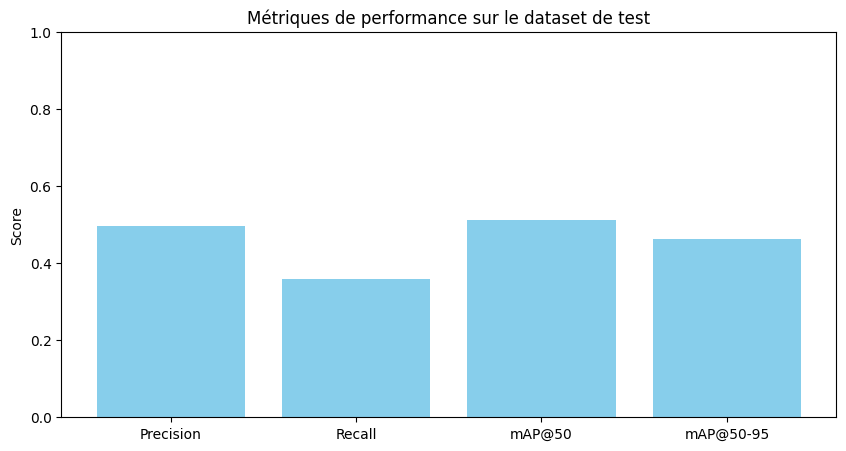



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/2377 /content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images/0074585a-f4-1_jpg.rf.5e99c19bf092189ab16960f7bc6ce074_aug_1007.jpg: 640x640 1 112, 1 66, 1 71, 16.2ms
image 2/2377 /content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images/0074585a-f4-1_jpg.rf.5e99c19bf092189ab16960f7bc6ce074_aug_2305.jpg: 640x640 1 112, 1 121, 1 Advance direction sign exit ahead from other road than motorway or expressway, 1 no entry for bicycles

In [ ]:

# 1. Test sur le dataset de test

# Effectuer des prédictions sur le dataset de test
results = model.val(data="/content/drive/MyDrive/DATASIGNALISATION/data.yaml")

# 2. Extraction des métriques

# Extraire les métriques directement à partir de l'objet retourné
precision = results.box.p
recall = results.box.r
mAP50 = results.box.map50
mAP50_95 = results.box.map

# Afficher les métriques
print(f"Précision : {precision.mean():.2f}")
print(f"Rappel : {recall.mean():.2f}")
print(f"mAP@50 : {mAP50.mean():.2f}")
print(f"mAP@50-95 : {mAP50_95.mean():.2f}")

# 3. Visualisation des métriques
metrics = ["Precision", "Recall", "mAP@50", "mAP@50-95"]
values = [precision.mean(), recall.mean(), mAP50.mean(), mAP50_95.mean()]

plt.figure(figsize=(10, 5))
plt.bar(metrics, values, color="skyblue")
plt.title("Métriques de performance sur le dataset de test")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.show()


# 4. Prédictions sur les images de test

test_images_dir = "/content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images"

predictions = model.predict(source=test_images_dir, save=True, save_txt=True)


# 5. Visualisation des prédictions
import cv2
import glob
from IPython.display import Image, display

# Chemin des images prédites (générées par YOLOv10)
predicted_images = glob.glob("runs/detect/YOLOv10n_training4/predict/*/*.jpg")

# Afficher les 5 premières images prédites avec les annotations
print("Visualisation des prédictions sur le dataset de test :")
for img_path in predicted_images[:5]:
    display(Image(filename=img_path))

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/DATASIGNALISATION/yolov10s.pt")

model.train(data="/content/drive/MyDrive/DATASIGNALISATION/data.yaml",
            epochs=100,
            imgsz=640,
            batch=32,
            name="YOLOv10s_training")

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/DATASIGNALISATION/yolov10s.pt, data=/content/drive/MyDrive/DATASIGNALISATION/data.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv10s_training, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False,

train: Scanning /content/drive/MyDrive/DATASIGNALISATION/train/labels.cache... 1174 images, 141 backgrounds, 0 corrupt: 100%|██████████| 1314/1314 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/306dc033-d1-2_jpg.rf.63ab6735367edc2baa4410d27c492903.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/54784ce7-e21-13_jpg.rf.8912fde49cf026f923ad5b1827c36434.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/5d579e2a-a29-3_jpg.rf.3c1005e341f42b3f6dcb1b03ac39cf18.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/670c5ae6-e31-4_jpg.rf.b6f6963748163c68af79d7796db9dbfd.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/sign4_jpg.rf.552334b8dffc9d619eed7cb9389a0314.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/sign4_jpg.rf.7bc9256bfd7c3e180f73e9e30a9dbf5e.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train


val: Scanning /content/drive/MyDrive/DATASIGNALISATION/valid/labels.cache... 37 images, 2 backgrounds, 0 corrupt: 100%|██████████| 39/39 [00:00<?, ?it/s]


Plotting labels to runs/detect/YOLOv10s_training/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=3.7e-05, momentum=0.9) with parameter groups 99 weight(decay=0.0), 112 weight(decay=0.0005), 111 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/YOLOv10s_training
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      12.8G      1.895      24.96       2.88         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      12.8G     0.9115      14.01      2.223          5        640: 100%|██████████| 42/42 [00:36<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      12.8G     0.6783      11.37      2.043         17        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70     0.0025     0.0627     0.0154     0.0122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      12.8G     0.6339       9.85      1.996         22        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70     0.0173      0.145     0.0599       0.05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      12.8G     0.5745      8.772      1.964         16        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70     0.0156      0.183     0.0581     0.0438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      12.8G     0.5574      8.073      1.936         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.473     0.0453     0.0638     0.0487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      12.8G     0.5421      7.501      1.934         13        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70     0.0422      0.321      0.115     0.0968



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      12.8G     0.5215      7.034      1.919          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70     0.0277      0.378      0.113     0.0936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      12.8G     0.5236      6.624      1.904          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.816     0.0453      0.136      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      12.8G     0.5116      6.317      1.889         15        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.709     0.0859      0.128      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      12.8G     0.5335       6.07      1.925          5        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70     0.0483      0.439      0.143     0.0963



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      12.8G     0.4879      5.727      1.885          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70     0.0325      0.512      0.185      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      12.8G     0.5085      5.521      1.873          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70     0.0344      0.579      0.176      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      12.8G     0.4942      5.304      1.881          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.388      0.379      0.218      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      12.8G     0.4839       5.08      1.866         11        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         39         70      0.743      0.151      0.244      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      12.8G     0.5052      4.921      1.879         26        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.748      0.181      0.302      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      12.8G     0.4838      4.682      1.859         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.795      0.177      0.398      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      12.8G     0.5047      4.533      1.862          8        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.773      0.231      0.347      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      12.8G     0.4644      4.531      1.842          5        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]

                   all         39         70      0.775       0.24      0.334      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      12.8G     0.4508      4.268      1.848         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.753      0.242      0.325       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      12.8G     0.4641      4.248      1.848         10        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.735       0.27      0.376      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      12.8G     0.4631      4.047      1.853          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.673      0.271      0.408      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      12.8G     0.4677      3.987      1.854         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.752      0.231      0.399      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      12.8G      0.468      3.802      1.845         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.679      0.234       0.38      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      12.8G     0.4428      3.757      1.836         13        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.853      0.198      0.436      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      12.8G     0.4337      3.649      1.826         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.717      0.277      0.482       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      12.8G      0.434      3.609      1.842          5        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.706      0.281      0.427      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      12.8G     0.4656      3.565      1.844          9        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.832      0.178      0.425      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      12.8G     0.4544      3.466      1.845          8        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.765      0.259      0.456      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      12.8G     0.4397       3.36      1.851          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

                   all         39         70      0.651      0.329      0.466      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      12.8G     0.4125      3.257      1.812         15        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.669      0.282      0.453      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      12.8G     0.4201      3.299      1.832          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         39         70      0.726      0.305      0.456      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      12.8G     0.4363      3.262      1.835         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70       0.72      0.295      0.492      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      12.8G     0.4212      3.176      1.826         15        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.695      0.276      0.469      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      12.8G     0.3924      3.102      1.834         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.677      0.263      0.495      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      12.8G     0.4126      3.039       1.82          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all         39         70      0.731      0.342       0.47      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      12.8G     0.4251      3.044      1.834         11        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.733      0.344      0.452      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      12.8G     0.4459      3.135      1.825          2        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.606      0.299      0.462      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      12.8G     0.4062       2.92      1.805         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70       0.73      0.291      0.466      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      12.8G     0.4297      2.945      1.822         17        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         39         70      0.662      0.338      0.464      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      12.8G      0.415      2.816      1.819         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70       0.71      0.327      0.471      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      12.8G     0.4172      2.754      1.807          8        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.681      0.279      0.537      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      12.8G     0.4014      2.836      1.805          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.644      0.362      0.531      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      12.8G     0.3902      2.694      1.816          8        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.728      0.284      0.588      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      12.8G      0.406       2.65      1.811         17        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.653      0.307      0.573      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      12.8G     0.3888      2.669       1.81         15        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.648       0.35      0.539      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      12.8G     0.3936      2.645      1.814         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.611      0.348      0.527      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      12.8G     0.3882      2.535      1.799         14        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.681      0.358      0.553      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      12.8G     0.3759      2.557        1.8         18        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.714      0.338      0.552      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      12.8G     0.3765      2.535      1.801         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         39         70      0.713      0.299      0.528      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      12.8G     0.3991      2.552      1.811         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.432      0.562      0.554      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      12.8G     0.3772      2.454      1.789          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.702       0.29      0.544      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      12.8G     0.3977      2.429      1.806          8        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         39         70      0.656      0.382      0.591      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      12.8G     0.3905      2.501      1.813         15        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.681      0.342      0.623      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      12.8G     0.3889      2.439      1.799         22        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.622      0.396      0.592      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      12.8G     0.3712       2.37      1.809         13        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.676      0.316      0.605       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      12.8G     0.3987      2.416      1.814         22        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.746      0.324      0.572      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      12.8G     0.3922      2.334      1.793         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.552      0.458      0.598      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      12.7G     0.4228      2.342      1.813          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.543      0.514      0.599      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      12.8G      0.377      2.347      1.797          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.653      0.396      0.621      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      12.8G     0.3658      2.323      1.791         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.726      0.362      0.548      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      12.8G     0.3738      2.249       1.79         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         39         70      0.675      0.353      0.592      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      12.8G     0.3987      2.308      1.823          9        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.649      0.345      0.565      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      12.8G     0.3739      2.238      1.793         15        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.659      0.371      0.586      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      12.8G     0.3696      2.196      1.793         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.289       0.77      0.583      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      12.8G     0.3772      2.207      1.809         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.606      0.388      0.597      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      12.8G     0.3786      2.228      1.804          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         39         70      0.723      0.379      0.578      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      12.8G     0.3653      2.207      1.793         20        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.719      0.355      0.587      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      12.8G     0.3606      2.217        1.8         10        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.154      0.839      0.602      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      12.7G     0.3627      2.092      1.805          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70       0.14       0.83      0.609      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      12.8G     0.3731      2.246       1.81          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.688      0.336      0.627      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      12.8G     0.3641      2.134      1.786         13        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.163      0.863      0.641       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      12.8G     0.3668      2.111      1.784          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.153      0.888      0.643      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      12.8G     0.3726      2.068      1.779         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70       0.63      0.371      0.663      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      12.8G     0.3683      2.118        1.8         23        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.323       0.69      0.602      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      12.8G     0.3502      2.121      1.776          8        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.516      0.552      0.662      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      12.8G     0.3466      2.048      1.787          4        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.534      0.488       0.65      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      12.7G     0.3605      1.986      1.795          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.413      0.663      0.668      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      12.7G     0.3857      2.023      1.801         16        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.495      0.578      0.676      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      12.8G     0.3649      2.007      1.793          6        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.163      0.876      0.656      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      12.8G     0.3496      2.084      1.801          9        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.145      0.863      0.663      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      12.8G     0.3536      2.028      1.785          5        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.634      0.473      0.663      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      12.8G     0.3415      2.053      1.783         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.386      0.725      0.663      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      12.8G     0.3651      1.989      1.785         15        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.155      0.863      0.614      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      12.8G     0.3422      1.917      1.788          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.149      0.863       0.65      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      12.8G      0.357      1.966      1.787         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.445      0.609      0.646      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      12.8G      0.369      1.967      1.798          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.147      0.851       0.64      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      12.8G     0.3314      1.928      1.781          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.519      0.491      0.643      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      12.8G     0.3404      1.941      1.782         21        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.144      0.863       0.66      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      12.8G     0.3513      1.976      1.782         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.717      0.396      0.656      0.595


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      12.7G     0.3549      1.719       1.78          6        640: 100%|██████████| 42/42 [00:37<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70       0.66        0.4      0.615      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      12.7G     0.3603      1.528      1.808         11        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70       0.71      0.458      0.629      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      12.7G      0.337      1.695       1.78          1        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.662      0.386       0.63      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      12.7G     0.3443       1.43      1.776          4        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.709      0.406      0.688      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      12.7G     0.3152      1.357      1.759          8        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.687      0.387       0.66      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      12.7G     0.3198      1.406       1.78          5        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.715      0.387      0.664      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      12.7G     0.3263      1.403      1.756          5        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.715      0.387      0.694       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      12.7G     0.3299      1.348      1.772          5        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.696      0.363      0.692      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      12.7G     0.3193      1.283      1.755          8        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.745      0.363      0.696       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      12.7G     0.3212      1.403      1.752          4        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.719      0.363      0.695      0.629



100 epochs completed in 1.088 hours.
Optimizer stripped from runs/detect/YOLOv10s_training/weights/last.pt, 16.9MB
Optimizer stripped from runs/detect/YOLOv10s_training/weights/best.pt, 16.9MB

Validating runs/detect/YOLOv10s_training/weights/best.pt...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10s summary (fused): 293 layers, 8,239,296 parameters, 0 gradients, 25.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


                   all         39         70      0.691      0.387      0.695      0.631
                     1          1          1          1          0      0.497      0.497
                   108          1          1          1          0      0.199      0.159
                   121          1          2      0.689        0.5      0.695       0.62
                   128          1          1      0.523          1      0.995      0.796
                   139          1          1      0.515          1      0.995      0.895
                   172          1          1      0.526          1      0.995      0.895
                   173          1          1          0          0      0.111     0.0799
                   180          1          3      0.286          1      0.474      0.288
                   181          7          8      0.611      0.375      0.431      0.358
                    33          3          5          1          0      0.137     0.0808
                    3

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([  1,   9,  20,  26,  34,  64,  65,  72,  73,  87,  90, 102, 109, 111, 117, 118, 140, 141, 152, 163, 164, 166, 168, 169, 176, 178, 183, 184, 200, 203, 212, 215, 217, 226, 230, 231, 233, 236, 237, 238, 257])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e4efc238760>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033, 

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10s summary (fused): 293 layers, 8,239,296 parameters, 0 gradients, 25.6 GFLOPs


val: Scanning /content/drive/MyDrive/DATASIGNALISATION/valid/labels.cache... 37 images, 2 backgrounds, 0 corrupt: 100%|██████████| 39/39 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]


                   all         39         70      0.691      0.387      0.694       0.63
                     1          1          1          1          0      0.497      0.497
                   108          1          1          1          0      0.199      0.159
                   121          1          2      0.702        0.5      0.695       0.62
                   128          1          1      0.523          1      0.995      0.796
                   139          1          1      0.515          1      0.995      0.895
                   172          1          1      0.526          1      0.995      0.895
                   173          1          1          0          0      0.111     0.0836
                   180          1          3      0.287          1      0.474      0.289
                   181          7          8      0.611      0.375      0.431      0.358
                    33          3          5          1          0      0.137     0.0808
                    3

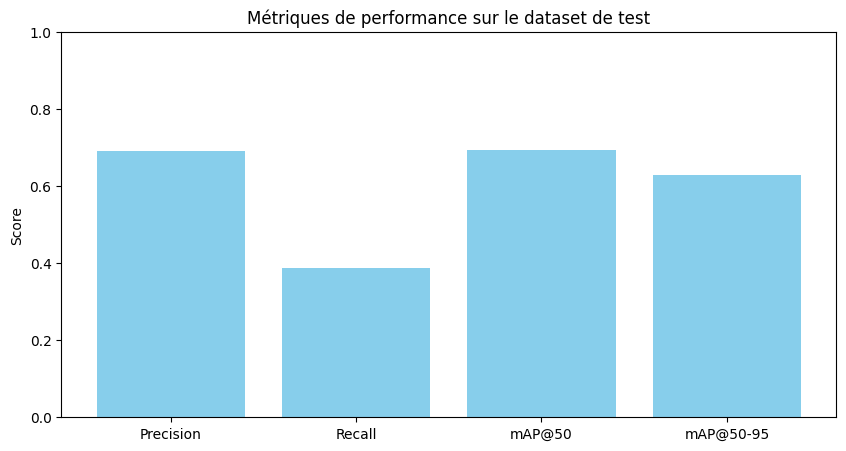



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/2377 /content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images/0074585a-f4-1_jpg.rf.5e99c19bf092189ab16960f7bc6ce074_aug_1007.jpg: 640x640 1 112, 1 2, 1 4, 18.7ms
image 2/2377 /content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images/0074585a-f4-1_jpg.rf.5e99c19bf092189ab16960f7bc6ce074_aug_2305.jpg: 640x640 1 112, 1 170, 1 2, 1 4, 18.7ms
image 3/2377 /content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images/0074585a-

In [ ]:

# 1. Test sur le dataset de test

# Effectuer des prédictions sur le dataset de test
results = model.val(data="/content/drive/MyDrive/DATASIGNALISATION/data.yaml")

# 2. Extraction des métriques

# Extraire les métriques directement à partir de l'objet retourné
precision = results.box.p
recall = results.box.r
mAP50 = results.box.map50
mAP50_95 = results.box.map

# Afficher les métriques
print(f"Précision : {precision.mean():.2f}")
print(f"Rappel : {recall.mean():.2f}")
print(f"mAP@50 : {mAP50.mean():.2f}")
print(f"mAP@50-95 : {mAP50_95.mean():.2f}")

# 3. Visualisation des métriques
metrics = ["Precision", "Recall", "mAP@50", "mAP@50-95"]
values = [precision.mean(), recall.mean(), mAP50.mean(), mAP50_95.mean()]

plt.figure(figsize=(10, 5))
plt.bar(metrics, values, color="skyblue")
plt.title("Métriques de performance sur le dataset de test")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.show()


# 4. Prédictions sur les images de test

test_images_dir = "/content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images"

predictions = model.predict(source=test_images_dir, save=True, save_txt=True)


# 5. Visualisation des prédictions
import cv2
import glob
from IPython.display import Image, display

# Chemin des images prédites (générées par YOLOv10)
predicted_images = glob.glob("runs/detect/YOLOv10n_training5/predict/*/*.jpg")

# Afficher les 5 premières images prédites avec les annotations
print("Visualisation des prédictions sur le dataset de test :")
for img_path in predicted_images[:5]:
    display(Image(filename=img_path))

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/DATASIGNALISATION/yolov10s.pt")

model.train(data="/content/drive/MyDrive/DATASIGNALISATION/data.yaml",
            epochs=130,
            imgsz=640,
            batch=32,
            name="YOLOv10s_training")

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/DATASIGNALISATION/yolov10s.pt, data=/content/drive/MyDrive/DATASIGNALISATION/data.yaml, epochs=130, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv10s_training4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False

train: Scanning /content/drive/MyDrive/DATASIGNALISATION/train/labels.cache... 1174 images, 141 backgrounds, 0 corrupt: 100%|██████████| 1314/1314 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/306dc033-d1-2_jpg.rf.63ab6735367edc2baa4410d27c492903.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/54784ce7-e21-13_jpg.rf.8912fde49cf026f923ad5b1827c36434.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/5d579e2a-a29-3_jpg.rf.3c1005e341f42b3f6dcb1b03ac39cf18.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/670c5ae6-e31-4_jpg.rf.b6f6963748163c68af79d7796db9dbfd.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/sign4_jpg.rf.552334b8dffc9d619eed7cb9389a0314.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train/images/sign4_jpg.rf.7bc9256bfd7c3e180f73e9e30a9dbf5e.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/DATASIGNALISATION/train


val: Scanning /content/drive/MyDrive/DATASIGNALISATION/valid/labels.cache... 37 images, 2 backgrounds, 0 corrupt: 100%|██████████| 39/39 [00:00<?, ?it/s]


Plotting labels to runs/detect/YOLOv10s_training4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=3.7e-05, momentum=0.9) with parameter groups 99 weight(decay=0.0), 112 weight(decay=0.0005), 111 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/YOLOv10s_training4
Starting training for 130 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/130      12.8G      1.895      24.96       2.88         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/130      12.8G      0.905      13.99      2.219          5        640: 100%|██████████| 42/42 [00:36<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/130      12.8G     0.6798      11.37      2.049         17        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70    0.00427      0.108     0.0166     0.0134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/130      12.8G     0.6365      9.846      1.999         22        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70     0.0375       0.16     0.0767     0.0677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/130      12.8G     0.5706      8.761      1.965         16        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70     0.0254      0.207     0.0715     0.0551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/130      12.8G     0.5635      8.053      1.936         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         39         70     0.0166      0.235     0.0565      0.044



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/130      12.8G     0.5431      7.461      1.938         13        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         39         70     0.0146      0.329     0.0663     0.0522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/130      12.8G     0.5322      6.991      1.926          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70     0.0185      0.341     0.0758     0.0609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/130      12.8G     0.5116       6.57      1.896          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         39         70      0.284      0.175      0.133      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/130      12.8G     0.5169      6.268       1.89         15        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.826     0.0859      0.163      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/130      12.7G     0.5682      5.982      1.955          5        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.777     0.0972      0.201      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/130      12.8G     0.4938      5.619      1.881          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.695      0.154      0.213       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/130      12.8G     0.5214       5.42      1.885          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.809     0.0894      0.218      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/130      12.8G      0.495      5.255      1.877          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.733      0.146      0.217      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/130      12.8G     0.4909      4.999       1.87         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.756      0.141      0.285      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/130      12.7G     0.5044      4.854      1.875         26        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.673      0.178      0.269      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/130      12.8G     0.4737       4.61      1.852         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.661      0.243      0.357      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/130      12.8G     0.5094      4.479      1.863          8        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.825      0.115      0.362      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/130      12.8G      0.465      4.467      1.841          5        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.719      0.159       0.28      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/130      12.8G     0.4447      4.194      1.841         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         39         70      0.688      0.218      0.324      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/130      12.8G     0.4661       4.17      1.846         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.751       0.23      0.353      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/130      12.8G     0.4601      4.001      1.849          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.747      0.215      0.335      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/130      12.8G     0.4647      3.911       1.85         12        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.811      0.175      0.371      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/130      12.8G     0.4586      3.727      1.838         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.722      0.192      0.362      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/130      12.8G     0.4452      3.709      1.835         13        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.732       0.25      0.387      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/130      12.8G     0.4369      3.597      1.825         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.735      0.262      0.431      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/130      12.8G     0.4329      3.556      1.837          5        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         39         70      0.751      0.259       0.42       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/130      12.8G     0.4636      3.542      1.834          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.715      0.217      0.417      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/130      12.8G      0.442      3.409      1.833          8        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.787      0.225      0.433      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/130      12.8G     0.4315      3.297      1.846          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70       0.69      0.238      0.411      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/130      12.8G     0.4127      3.187      1.806         15        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.661      0.273      0.472      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/130      12.8G     0.4193      3.234      1.829          6        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.651      0.304      0.454      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/130      12.8G     0.4389      3.186      1.832         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.574      0.363      0.448        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/130      12.7G      0.419      3.094       1.82         15        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.106      0.797      0.508      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/130      12.8G     0.3928      3.018      1.833         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.702      0.298      0.447        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/130      12.8G     0.4105      2.966      1.817          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.107      0.756       0.45      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/130      12.8G     0.4255      2.969      1.833         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.653      0.284      0.448      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/130      12.8G     0.4519      3.026      1.834          2        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.697      0.276      0.494      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/130      12.8G     0.4108      2.844      1.805         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.618      0.343      0.563      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/130      12.8G     0.4338      2.853      1.823         17        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.713      0.282      0.511      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/130      12.8G     0.4161       2.74      1.817         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.516      0.439      0.526      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/130      12.8G     0.4163      2.677      1.804          8        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.701      0.373      0.577      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/130      12.7G     0.3916       2.75      1.797          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70       0.72      0.298      0.552      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/130      12.8G     0.3941      2.608      1.817          8        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.817      0.277      0.517      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/130      12.7G     0.4067      2.576      1.808         17        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.722      0.331      0.572      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/130      12.8G     0.3883      2.588      1.808         15        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         39         70      0.734      0.305       0.48      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/130      12.8G     0.3928      2.564      1.809         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.717      0.331      0.559      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/130      12.8G     0.3842      2.461      1.793         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.686      0.346      0.539      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/130      12.8G      0.381      2.482      1.803         18        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.736      0.345      0.539       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/130      12.8G     0.3742      2.452      1.797         10        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.705      0.323      0.563      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/130      12.8G     0.4018      2.473      1.811         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         39         70      0.659      0.404      0.545      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/130      12.8G     0.3729      2.388      1.783          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.699      0.324      0.556      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/130      12.7G        0.4      2.365      1.804          8        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         39         70      0.673      0.373      0.593      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/130      12.8G     0.3886      2.424      1.806         15        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.667      0.418      0.623      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/130      12.8G     0.3976      2.354      1.801         22        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.678      0.404      0.607      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/130      12.8G     0.3723      2.271      1.807         13        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70       0.71      0.357      0.578      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/130      12.8G     0.3973      2.333       1.81         22        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.635      0.396      0.594      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/130      12.8G      0.399      2.252      1.794         12        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.713       0.37      0.558        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/130      12.7G     0.4238      2.273      1.809          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         39         70      0.655      0.465      0.621       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/130      12.8G     0.3768      2.249      1.792          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.702       0.38       0.53      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/130      12.8G     0.3621      2.223      1.789         11        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.599      0.409       0.64      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/130      12.8G     0.3741      2.174      1.787         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         39         70      0.629      0.459      0.581      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/130      12.8G     0.3885      2.205      1.807          9        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.694      0.368      0.578       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/130      12.8G     0.3765      2.151      1.796         15        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.699      0.392      0.578       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/130      12.8G     0.3693       2.11       1.79         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.671      0.356      0.583      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/130      12.8G     0.3764       2.13      1.803         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.476      0.567      0.605      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/130      12.8G     0.3787      2.123      1.803          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         39         70      0.312      0.716      0.628       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/130      12.8G     0.3664      2.096      1.789         20        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.638      0.413      0.634      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/130      12.8G        inf      2.112      1.797         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.597      0.458      0.622      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/130      12.7G     0.3629       1.99      1.802          9        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all         39         70       0.34      0.649        0.6      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/130      12.8G     0.3689      2.143      1.806          6        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.686      0.381      0.598      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/130      12.8G     0.3729      2.038      1.784         13        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.303      0.657      0.645      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/130      12.8G     0.3617      1.996      1.779          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.591      0.514      0.606      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/130      12.8G     0.3748      1.961      1.775         14        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.649      0.443      0.597      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/130      12.7G      0.374          2      1.798         23        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70       0.16      0.894      0.657      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/130      12.8G     0.3587      2.003      1.778          8        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.603      0.509       0.69      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/130      12.7G     0.3431      1.979      1.784          4        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.701      0.431      0.597      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/130      12.7G     0.3561      1.885      1.787          9        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         39         70      0.723      0.352      0.618      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/130      12.7G     0.3814      1.905      1.793         16        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all         39         70      0.602      0.511      0.602      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/130      12.8G     0.3506      1.874      1.777          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.152      0.772      0.618       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/130      12.8G      0.345      1.952       1.79          9        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.652      0.412      0.611      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/130      12.8G     0.3367      1.901       1.77          5        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.677      0.343      0.673      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/130      12.8G     0.3432      1.921      1.782         14        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         39         70      0.587      0.452      0.685       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/130      12.8G     0.3665      1.864      1.781         15        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.174      0.833      0.652      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/130      12.8G     0.3404      1.777      1.782          7        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.193      0.809      0.604      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/130      12.8G     0.3511      1.832      1.779         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.507      0.608      0.622      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/130      12.8G     0.3649      1.845      1.793          7        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.511      0.593      0.644      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/130      12.8G     0.3285      1.764      1.779          7        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.197      0.845      0.683      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/130      12.8G     0.3421      1.805      1.781         21        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.301      0.731      0.687      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/130      12.8G     0.3475      1.831      1.779         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.617      0.486      0.692       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/130      12.8G     0.3436      1.811       1.78         14        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.609      0.522      0.639      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/130      12.8G     0.3467      1.847      1.794          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.152       0.87      0.701      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/130      12.8G     0.3394      1.757      1.773         11        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.167       0.87       0.65      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/130      12.7G     0.3466      1.796      1.777         12        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.507       0.54      0.634      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/130      12.8G     0.3535       1.78      1.788         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.196      0.842      0.667      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/130      12.8G     0.3474      1.748      1.782         25        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.195      0.842       0.69      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/130      12.8G     0.3354      1.722       1.77         11        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.181      0.818      0.689      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/130      12.8G     0.3265      1.726      1.776         10        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         39         70      0.195      0.845      0.668      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/130      12.7G     0.3271      1.725      1.771          6        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.183       0.87      0.686      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/130      12.8G     0.3322      1.684      1.768         10        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.595      0.531      0.637      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/130      12.8G     0.3445      1.773      1.774         11        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

                   all         39         70      0.338      0.702      0.677      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/130      12.8G     0.3512      1.692      1.779          9        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         39         70      0.167      0.833      0.656      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/130      12.8G     0.3251      1.607      1.774         13        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.173      0.809      0.662      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/130      12.8G     0.3366      1.683      1.775          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.394      0.652      0.681      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/130      12.7G     0.3191      1.797       1.77          9        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.384      0.673      0.659      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/130      12.8G     0.3404      1.677      1.788          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.486      0.616      0.625      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/130      12.8G     0.3221      1.676      1.769         12        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.192      0.821      0.658      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/130      12.8G     0.3199      1.689       1.78          9        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.655      0.484      0.675       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/130      12.7G     0.3249      1.663      1.776         14        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.178      0.809      0.658       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/130      12.8G     0.3471      1.721      1.783          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         39         70      0.164      0.845      0.641      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/130      12.8G     0.3225      1.682      1.773          8        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

                   all         39         70      0.578      0.522       0.62      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/130      12.8G     0.3241      1.586      1.766         19        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.535       0.58      0.621      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/130      12.7G     0.3184      1.692      1.762          7        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.544      0.609       0.67        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/130      12.8G     0.3192      1.643      1.781         10        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.477      0.613      0.682      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/130      12.7G     0.3413      1.603      1.791          8        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.489      0.563      0.666      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/130      12.8G     0.3245      1.622      1.764         19        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.646      0.482      0.661      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/130      12.8G     0.3298      1.549      1.782         20        640: 100%|██████████| 42/42 [00:36<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.644      0.439      0.638      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/130      12.7G     0.3226      1.617      1.783         11        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.509      0.587      0.653      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/130      12.8G     0.3214      1.636       1.79          9        640: 100%|██████████| 42/42 [00:36<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

                   all         39         70      0.649       0.51      0.705      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/130      12.7G     0.3347      1.597      1.765         10        640: 100%|██████████| 42/42 [00:35<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70       0.68      0.432      0.658      0.589


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/130      12.7G     0.3535      1.304      1.807          8        640: 100%|██████████| 42/42 [00:37<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.602      0.504      0.643       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/130      12.7G      0.322      1.171      1.776          8        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

                   all         39         70      0.658      0.382      0.603      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/130      12.7G     0.3312      1.111      1.768          6        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.667      0.447      0.633      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/130      12.7G     0.3132      1.211      1.757          2        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         39         70      0.544      0.589      0.636      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/130      12.7G     0.3642      1.267      1.806          2        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         39         70      0.704       0.43      0.616      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/130      12.7G        0.3      1.005      1.757          5        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70       0.69      0.454      0.633       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/130      12.7G     0.3142      1.041      1.767         10        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         39         70      0.701      0.437      0.622       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/130      12.7G     0.3018      1.039      1.762          5        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         39         70      0.698      0.437      0.631      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/130      12.7G     0.3083     0.9916      1.735          7        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         39         70      0.701      0.466      0.664      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/130      12.7G     0.3122     0.9816      1.739          4        640: 100%|██████████| 42/42 [00:35<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all         39         70      0.696      0.462      0.662       0.59



130 epochs completed in 1.403 hours.
Optimizer stripped from runs/detect/YOLOv10s_training4/weights/last.pt, 16.9MB
Optimizer stripped from runs/detect/YOLOv10s_training4/weights/best.pt, 16.9MB

Validating runs/detect/YOLOv10s_training4/weights/best.pt...
Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10s summary (fused): 293 layers, 8,239,296 parameters, 0 gradients, 25.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


                   all         39         70      0.649       0.51      0.705      0.637
                     1          1          1      0.527          1      0.995      0.895
                   108          1          1      0.869          1      0.995      0.796
                   121          1          2       0.34        0.5      0.276      0.276
                   128          1          1      0.511          1      0.995      0.697
                   139          1          1          1          0      0.332      0.298
                   172          1          1       0.44          1      0.995      0.895
                   173          1          1      0.191          1      0.249      0.182
                   180          1          3      0.269          1      0.544      0.351
                   181          7          8      0.253       0.25       0.25       0.19
                    33          3          5          1      0.307      0.431       0.28
                    3

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([  1,   9,  20,  26,  34,  64,  65,  72,  73,  87,  90, 102, 109, 111, 117, 118, 140, 141, 152, 163, 164, 166, 168, 169, 176, 178, 183, 184, 200, 203, 212, 215, 217, 226, 230, 231, 233, 236, 237, 238, 257])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e510a18a050>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033, 

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10s summary (fused): 293 layers, 8,239,296 parameters, 0 gradients, 25.6 GFLOPs


val: Scanning /content/drive/MyDrive/DATASIGNALISATION/valid/labels.cache... 37 images, 2 backgrounds, 0 corrupt: 100%|██████████| 39/39 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.31it/s]


                   all         39         70      0.649       0.51      0.705      0.637
                     1          1          1      0.527          1      0.995      0.895
                   108          1          1      0.871          1      0.995      0.711
                   121          1          2       0.34        0.5      0.276      0.276
                   128          1          1      0.511          1      0.995      0.697
                   139          1          1          1          0      0.332      0.298
                   172          1          1      0.444          1      0.995      0.895
                   173          1          1      0.192          1      0.249      0.182
                   180          1          3      0.271          1      0.544      0.351
                   181          7          8      0.254       0.25      0.248      0.189
                    33          3          5          1      0.305      0.431       0.28
                    3

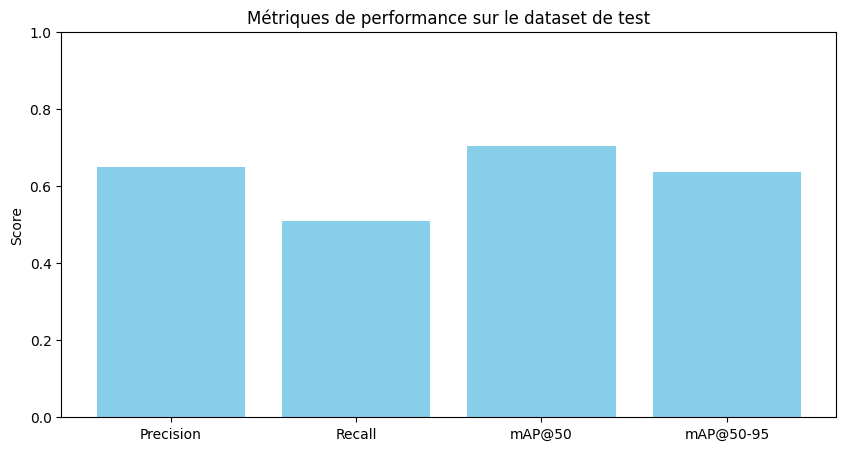



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/2377 /content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images/0074585a-f4-1_jpg.rf.5e99c19bf092189ab16960f7bc6ce074_aug_1007.jpg: 640x640 1 112, 1 169, 1 2, 1 4, 18.7ms
image 2/2377 /content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images/0074585a-f4-1_jpg.rf.5e99c19bf092189ab16960f7bc6ce074_aug_2305.jpg: 640x640 1 112, 1 2, 1 4, 18.7ms
image 3/2377 /content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images/0074585a-

In [ ]:

# 1. Test sur le dataset de test

# Effectuer des prédictions sur le dataset de test
results = model.val(data="/content/drive/MyDrive/DATASIGNALISATION/data.yaml")

# 2. Extraction des métriques

# Extraire les métriques directement à partir de l'objet retourné
precision = results.box.p
recall = results.box.r
mAP50 = results.box.map50
mAP50_95 = results.box.map

# Afficher les métriques
print(f"Précision : {precision.mean():.2f}")
print(f"Rappel : {recall.mean():.2f}")
print(f"mAP@50 : {mAP50.mean():.2f}")
print(f"mAP@50-95 : {mAP50_95.mean():.2f}")

# 3. Visualisation des métriques
metrics = ["Precision", "Recall", "mAP@50", "mAP@50-95"]
values = [precision.mean(), recall.mean(), mAP50.mean(), mAP50_95.mean()]

plt.figure(figsize=(10, 5))
plt.bar(metrics, values, color="skyblue")
plt.title("Métriques de performance sur le dataset de test")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.show()


# 4. Prédictions sur les images de test

test_images_dir = "/content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images"

predictions = model.predict(source=test_images_dir, save=True, save_txt=True)


# 5. Visualisation des prédictions
import cv2
import glob
from IPython.display import Image, display

# Chemin des images prédites (générées par YOLOv10)
predicted_images = glob.glob("runs/detect/YOLOv10n_training5/predict/*/*.jpg")

# Afficher les 5 premières images prédites avec les annotations
print("Visualisation des prédictions sur le dataset de test :")
for img_path in predicted_images[:5]:
    display(Image(filename=img_path))

In [5]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/DATASIGNALISATION/yolov10b.pt")

model.train(data="/content/drive/MyDrive/DATASIGNALISATION/data.yaml",
            epochs=130,
            imgsz=640,
            batch=16,
            name="YOLOv10s_training")

100%|██████████| 39.7M/39.7M [00:00<00:00, 76.3MB/s]


Ultralytics 8.3.62 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/DATASIGNALISATION/yolov10b.pt, data=/content/drive/MyDrive/DATASIGNALISATION/data.yaml, epochs=130, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv10s_training, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False,

RuntimeError: Dataset '/content/drive/MyDrive/DATASIGNALISATION/data.yaml' error ❌ '/content/drive/MyDrive/DATASIGNALISATION/data.yaml' does not exist

In [ ]:

# 1. Test sur le dataset de test

# Effectuer des prédictions sur le dataset de test
results = model.val(data="/content/drive/MyDrive/DATASIGNALISATION/data.yaml")

# 2. Extraction des métriques

# Extraire les métriques directement à partir de l'objet retourné
precision = results.box.p
recall = results.box.r
mAP50 = results.box.map50
mAP50_95 = results.box.map

# Afficher les métriques
print(f"Précision : {precision.mean():.2f}")
print(f"Rappel : {recall.mean():.2f}")
print(f"mAP@50 : {mAP50.mean():.2f}")
print(f"mAP@50-95 : {mAP50_95.mean():.2f}")

# 3. Visualisation des métriques
metrics = ["Precision", "Recall", "mAP@50", "mAP@50-95"]
values = [precision.mean(), recall.mean(), mAP50.mean(), mAP50_95.mean()]

plt.figure(figsize=(10, 5))
plt.bar(metrics, values, color="skyblue")
plt.title("Métriques de performance sur le dataset de test")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.show()


# 4. Prédictions sur les images de test

test_images_dir = "/content/drive/MyDrive/DATASIGNALISATION/final_dataset/test/images"

predictions = model.predict(source=test_images_dir, save=True, save_txt=True)


# 5. Visualisation des prédictions
import cv2
import glob
from IPython.display import Image, display

# Chemin des images prédites (générées par YOLOv10)
predicted_images = glob.glob("runs/detect/YOLOv10n_training7/predict/*/*.jpg")

# Afficher les 5 premières images prédites avec les annotations
print("Visualisation des prédictions sur le dataset de test :")
for img_path in predicted_images[:5]:
    display(Image(filename=img_path))

In [6]:
from google.colab import drive
drive.mount('/content/drive')

ValueError: Mountpoint must not already contain files